# Analysis and figures 
for Tests 1-5

In [16]:
%load_ext autoreload
%autoreload 2
import logging
import os
import pathlib
import pickle
import string

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import PIL
import pygmt
import seaborn as sns
import verde as vd
import xarray as xr
import xrft
from invert4geom import plotting, utils
from invert4geom import synthetic as inv_synthetic
from polartoolkit import fetch, maps, profiles
from polartoolkit import utils as polar_utils

from synthetic_bathymetry_inversion import ice_shelf_stats, synthetic

sns.set_theme()


os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"

logging.getLogger().setLevel(logging.INFO)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [17]:
# set grid parameters
spacing = 2e3
inversion_region = (-40e3, 110e3, -1600e3, -1400e3)

plot_region = inversion_region

In [2]:
true_density_contrast = 1476

bathymetry, basement, _ = synthetic.load_synthetic_model(
    spacing=spacing,
    inversion_region=inversion_region,
    buffer=spacing * 10,
    basement=True,
    zref=0,
    bathymetry_density_contrast=true_density_contrast,
    plot_topography=False,
    plot_gravity=False,
)

buffer_region = polar_utils.get_grid_info(bathymetry)[1]

# clip to plot region
bathymetry = bathymetry.sel(
    easting=slice(plot_region[0], plot_region[1]),
    northing=slice(plot_region[2], plot_region[3]),
)
basement = basement.sel(
    easting=slice(plot_region[0], plot_region[1]),
    northing=slice(plot_region[2], plot_region[3]),
)

requested spacing (2000.0) is smaller than the original (5000.0).
requested spacing (2000.0) is smaller than the original (5000.0).


  0%|          | 0/7676 [00:00<?, ?it/s]

  0%|          | 0/7676 [00:00<?, ?it/s]

## Load results of notebooks 01-05

In [3]:
damping_studies = []
density_studies = []
optimal_results = []

# uncertainty_results = []
constraint_points_dfs = []
sensitivity_results = []
final_bathymetries = []
final_uncertainties = []
final_stochastic_means = []
inversion_titles = [
    "Best case scenario",
    "Errors in gravity",
    "Airborne survey",
    "Regional gravity",
    "Realistic scenario",
]

for i in range(1, 6):
    # get names for various studies / results
    damping_study_fname = (
        f"../results/Ross_Sea/Ross_Sea_0{i}_damping_cv_damping_cv_study.pickle"
    )
    if i >= 4:
        density_study_fname = (
            f"../results/Ross_Sea/Ross_Sea_0{i}_density_cv_kfolds_study.pickle"
        )
    else:
        density_study_fname = (
            f"../results/Ross_Sea/Ross_Sea_0{i}_density_cv_zref_density_cv_study.pickle"
        )
    optimal_results_fname = f"../results/Ross_Sea/Ross_Sea_0{i}_optimal_results.pickle"

    # open studies
    with pathlib.Path(damping_study_fname).open("rb") as f:
        damp_study = pickle.load(f)
    with pathlib.Path(density_study_fname).open("rb") as f:
        dens_study = pickle.load(f)
    with pathlib.Path(optimal_results_fname).open("rb") as f:
        optimal_result = pickle.load(f)

    topo_results, _, _, _ = optimal_result

    final_bathymetry = topo_results.set_index(["northing", "easting"]).to_xarray().topo

    uncertainty_ds = xr.load_dataset(
        f"../results/Ross_Sea/Ross_Sea_0{i}_uncertainty.nc"
    )
    sensitivity_ds = xr.load_dataset(
        f"../results/Ross_Sea/Ross_Sea_0{i}_sensitivity.nc"
    )

    # clip to inversion region
    final_bathymetry = final_bathymetry.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )
    final_uncert = sensitivity_ds.full_stdev.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )
    final_stochastic_mean = uncertainty_ds.weighted_mean.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )

    # add to lists
    damping_studies.append(damp_study)
    density_studies.append(dens_study)
    optimal_results.append(optimal_result)
    constraint_points_dfs.append(
        pd.read_csv(f"../results/Ross_Sea/Ross_Sea_0{i}_constraint_points.csv")
    )
    sensitivity_results.append(
        xr.load_dataset(f"../results/Ross_Sea/Ross_Sea_0{i}_sensitivity.nc")
    )
    final_bathymetries.append(final_bathymetry)
    final_stochastic_means.append(final_stochastic_mean)
    final_uncertainties.append(final_uncert)

In [4]:
abs_inversion_errors = []
uncert_errors = []
for i, g in enumerate(final_bathymetries):
    abs_inversion_error = np.abs(bathymetry - g)
    abs_inversion_errors.append(abs_inversion_error)

    uncert_errors.append(abs_inversion_error - final_uncertainties[i])

In [5]:
for i, t in enumerate(inversion_titles):
    print(i + 1, t)
    starting_bathymetry = (
        optimal_results[i][0]
        .set_index(["northing", "easting"])
        .to_xarray()
        .starting_topo
    )

    starting_bathymetry = starting_bathymetry.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )
    print(
        f"\tStarting bathymetry RMSE: {round(utils.rmse(bathymetry - starting_bathymetry), 2)} m"
    )
    print(
        f"\tDeterministic bathymetry RMSE: {round(utils.rmse(bathymetry - final_bathymetries[i]), 2)} m"
    )
    print(
        f"\tDeterministic bathymetry max absolute error: {round(vd.maxabs(bathymetry - final_bathymetries[i]), 2)} m"
    )
    print(
        f"\tStochastic bathymetry RMSE: {round(utils.rmse(bathymetry - final_stochastic_means[i]), 2)} m"
    )

    print(f"\tUncertainty RMS: {round(utils.rmse(final_uncertainties[i]), 2)} m")
    print(f"\tUncertainty RMSE: {round(utils.rmse(uncert_errors[i]), 2)} m")

    scores = damping_studies[i].trials_dataframe().value.to_numpy()
    parameters = damping_studies[i].trials_dataframe().params_damping.to_numpy()
    param_name = "Damping"
    df0 = pd.DataFrame({"scores": scores, "parameters": parameters})
    df = df0.sort_values(by="parameters")
    best = df.scores.argmin()
    best_damping = df.parameters.to_numpy()[best]
    print(f"\tOptimal damping: {round(best_damping, 4)}")

    scores = density_studies[i].trials_dataframe().value.to_numpy()
    parameters = (
        density_studies[i].trials_dataframe().params_density_contrast.to_numpy()
    )
    param_name = "Density"
    df0 = pd.DataFrame({"scores": scores, "parameters": parameters})
    df = df0.sort_values(by="parameters")
    best = df.scores.argmin()
    best_density = df.parameters.to_numpy()[best]
    print(f"\tOptimal density: {round(best_density)} kg/m^3")
    print(f"\tDensity contrast error: {best_density - true_density_contrast} kg/m^3")

    constraint_points = constraint_points_dfs[i]
    rmse = utils.rmse(
        constraint_points.starting_bathymetry - constraint_points.inverted_topography
    )

    print(f"\tConstraint points RMSE: {round(rmse, 3)} m")

1 Best case scenario
	Starting bathymetry RMSE: 25.98 m
	Deterministic bathymetry RMSE: 1.76 m
	Deterministic bathymetry max absolute error: 24.87 m
	Stochastic bathymetry RMSE: 2.05 m
	Uncertainty RMS: 1.37 m
	Uncertainty RMSE: 1.36 m
	Optimal damping: 0.014
	Optimal density: 1480 kg/m^3
	Density contrast error: 4 kg/m^3
	Constraint points RMSE: 3.381 m
2 Errors in gravity
	Starting bathymetry RMSE: 25.98 m
	Deterministic bathymetry RMSE: 15.54 m
	Deterministic bathymetry max absolute error: 132.86 m
	Stochastic bathymetry RMSE: 15.91 m
	Uncertainty RMS: 10.91 m
	Uncertainty RMSE: 9.86 m
	Optimal damping: 0.0141
	Optimal density: 1471 kg/m^3
	Density contrast error: -5 kg/m^3
	Constraint points RMSE: 19.532 m
3 Airborne survey
	Starting bathymetry RMSE: 25.98 m
	Deterministic bathymetry RMSE: 9.12 m
	Deterministic bathymetry max absolute error: 148.02 m
	Stochastic bathymetry RMSE: 8.9 m
	Uncertainty RMS: 4.56 m
	Uncertainty RMSE: 6.4 m
	Optimal damping: 0.0142
	Optimal density: 1464 

In [7]:
starting_bathymetry_no_errors = (
    optimal_results[0][0].set_index(["northing", "easting"]).to_xarray().starting_topo
)
starting_bathymetry_no_errors = starting_bathymetry_no_errors.sel(
    easting=slice(plot_region[0], plot_region[1]),
    northing=slice(plot_region[2], plot_region[3]),
)

In [8]:
print(
    f"Starting bathymetry MAE: {np.abs(bathymetry - starting_bathymetry_no_errors).mean().to_numpy()}"
    f"\nStarting bathymetry RMSE: {utils.rmse(bathymetry - starting_bathymetry_no_errors)}"
    f"\nmax absolute error: {np.abs(bathymetry - starting_bathymetry_no_errors).max().to_numpy()}"
)

Starting bathymetry MAE: 15.0527279185003
Starting bathymetry RMSE: 25.97734942125003
max absolute error: 164.39923609925518


## Location figure

In [8]:
ibcso_points_gdf, ibcso_polygons_gdf = fetch.ibcso_coverage(
    region=plot_region,
)

In [9]:
ibcso_points_gdf

,dataset_name,dataset_tid,weight,geometry,easting,northing
3,NBP94_6.xyz,10,10,POINT (109770.251 -1589039.712),109770.251441,-1.589040e+06
3,NBP94_6.xyz,10,10,POINT (109541.648 -1588891.732),109541.648463,-1.588892e+06
3,NBP94_6.xyz,10,10,POINT (109295.696 -1588705.992),109295.696152,-1.588706e+06
3,NBP94_6.xyz,10,10,POINT (109042.6 -1588513.108),109042.599997,-1.588513e+06
3,NBP94_6.xyz,10,10,POINT (108798.689 -1588330.43),108798.688784,-1.588330e+06
...,...,...,...,...,...,...
53,NGA_various.xyz,13,5,POINT (46074.726 -1401160.721),46074.726123,-1.401161e+06
36,NBP93_8.xyz,10,10,POINT (47246.316 -1401134.187),47246.316386,-1.401134e+06
37,NBP93_7.xyz,10,10,POINT (47246.316 -1401134.187),47246.316386,-1.401134e+06
36,NBP93_8.xyz,10,10,POINT (47393.275 -1401065.81),47393.275443,-1.401066e+06


In [10]:
polygon_points = ice_shelf_stats.polygons_to_points(
    ibcso_polygons_gdf,
    spacing=500,
)
polygon_points

,geometry,easting,northing
0,POINT (-39500 -1509160.059),-39500.000000,-1.509160e+06
1,POINT (-39500 -1508660.059),-39500.000000,-1.508660e+06
2,POINT (-39500 -1508160.059),-39500.000000,-1.508160e+06
3,POINT (-39500 -1507660.059),-39500.000000,-1.507660e+06
4,POINT (-39500 -1507160.059),-39500.000000,-1.507160e+06
...,...,...,...
9870,POINT (-38380.519 -1504416.675),-38380.519348,-1.504417e+06
9871,POINT (-38785.39 -1504419.603),-38785.389511,-1.504420e+06
9872,POINT (-39190.26 -1504422.531),-39190.259674,-1.504423e+06
9873,POINT (-39595.13 -1504425.458),-39595.129837,-1.504425e+06


In [11]:
total_ibcso_points = pd.concat([ibcso_points_gdf, polygon_points])
total_ibcso_points

,dataset_name,dataset_tid,weight,geometry,easting,northing
3,NBP94_6.xyz,10.0,10.0,POINT (109770.251 -1589039.712),109770.251441,-1.589040e+06
3,NBP94_6.xyz,10.0,10.0,POINT (109541.648 -1588891.732),109541.648463,-1.588892e+06
3,NBP94_6.xyz,10.0,10.0,POINT (109295.696 -1588705.992),109295.696152,-1.588706e+06
3,NBP94_6.xyz,10.0,10.0,POINT (109042.6 -1588513.108),109042.599997,-1.588513e+06
3,NBP94_6.xyz,10.0,10.0,POINT (108798.689 -1588330.43),108798.688784,-1.588330e+06
...,...,...,...,...,...,...
9870,NaN,NaN,NaN,POINT (-38380.519 -1504416.675),-38380.519348,-1.504417e+06
9871,NaN,NaN,NaN,POINT (-38785.39 -1504419.603),-38785.389511,-1.504420e+06
9872,NaN,NaN,NaN,POINT (-39190.26 -1504422.531),-39190.259674,-1.504423e+06
9873,NaN,NaN,NaN,POINT (-39595.13 -1504425.458),-39595.129837,-1.504425e+06


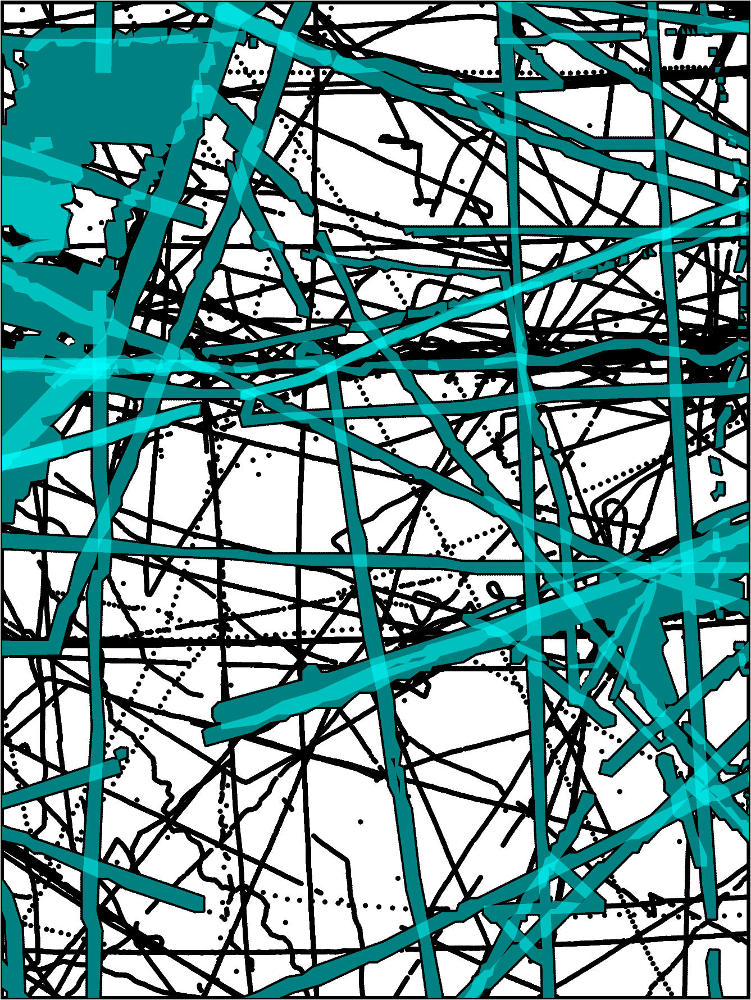

In [12]:
fig = maps.basemap(region=plot_region, points=total_ibcso_points, points_style="p2p")
fig.plot(
    ibcso_polygons_gdf,
    fill="cyan",
    close=True,
    transparency=50,
)
fig.show()

In [13]:
# calculate gravity data median distance
grd = fetch.resample_grid(bathymetry, spacing=100, verbose="q").rename(
    {"x": "easting", "y": "northing"}
)

min_dist = utils.dist_nearest_points(
    total_ibcso_points,
    grd,
).min_dist
print(f"mean minimum distance: {int(min_dist.mean().to_numpy())} m")
print(f"median minimum distance: {int(min_dist.median().to_numpy())} m")

requested spacing (100) is smaller than the original (2000.0).


mean minimum distance: 788 m
median minimum distance: 359 m


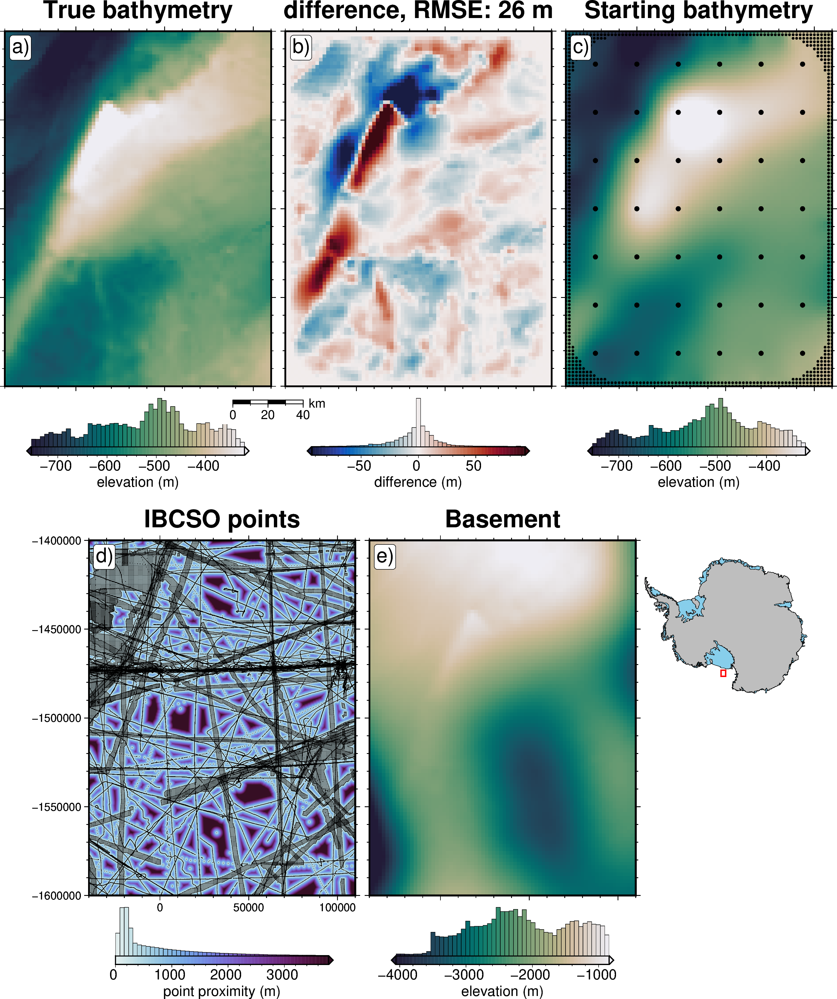

In [14]:
####
# Bathymetry
####
bathy_lims = polar_utils.get_combined_min_max(
    [bathymetry, starting_bathymetry_no_errors], robust=True
)
fig = maps.plot_grd(
    bathymetry,
    fig_height=10,
    cmap="rain",
    reverse_cpt=True,
    cpt_lims=bathy_lims,
    title="True bathymetry",
    cbar_label="elevation (m)",
    cbar_font="18p,Helvetica,black",
    frame=["nsew", "xaf10000", "yaf10000"],
    hist=True,
    scalebar=True,
    scalebar_position="jBR+o-.9c/-.6c",
)
fig.text(
    position="TL",
    justify="TL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j.2c",
    no_clip=True,
    fill="white",
    clearance="+tO",
    pen=True,
)
####
# Difference with starting
####
dif = bathymetry - starting_bathymetry_no_errors
fig = maps.plot_grd(
    dif,
    fig=fig,
    origin_shift="x",
    region=plot_region,
    title=f"difference, RMSE: {round(utils.rmse(dif))} m",
    cbar_label="difference (m)",
    cbar_font="18p,Helvetica,black",
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        dif, robust=True, absolute=True, robust_percentiles=(0.01, 0.99)
    ),
    frame=["nsew", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
)
# add subplot label
fig.text(
    position="TL",
    justify="TL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j.2c",
    no_clip=True,
    fill="white",
    clearance="+tO",
    pen=True,
)
####
# Starting bathymetry
####
fig = maps.plot_grd(
    starting_bathymetry_no_errors,
    fig=fig,
    origin_shift="x",
    region=plot_region,
    title="Starting bathymetry",
    cbar_label="elevation (m)",
    cbar_font="18p,Helvetica,black",
    cmap="rain",
    reverse_cpt=True,
    cpt_lims=bathy_lims,
    frame=["nsew", "xaf10000", "yaf10000"],
    hist=True,
    points=constraint_points_dfs[0][~constraint_points_dfs[0].inside],
    points_style="p2p",
)
fig.plot(
    x=constraint_points_dfs[0][constraint_points_dfs[0].inside].easting,
    y=constraint_points_dfs[0][constraint_points_dfs[0].inside].northing,
    style="p4p",
    pen="1p,black",
)
# add subplot label
fig.text(
    position="TL",
    justify="TL",
    text="c)",
    font="16p,Helvetica,black",
    offset="j.2c",
    no_clip=True,
    fill="white",
    clearance="+tO",
    pen=True,
)
####
# Min distance
####
fig = maps.plot_grd(
    min_dist,
    fig=fig,
    origin_shift="both",
    xshift_amount=-1.7,
    region=plot_region,
    title="IBCSO points",
    cbar_label="point proximity (m)",
    cbar_font="18p,Helvetica,black",
    cmap="dense",
    frame=["nSWe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cpt_lims=[
        0,
        polar_utils.get_min_max(
            min_dist,
            robust=True,
        )[1],
    ],
    points=total_ibcso_points,
    points_style="p",
    points_fill="black",
)
# add subplot label
fig.text(
    position="TL",
    justify="TL",
    text="d)",
    font="16p,Helvetica,black",
    offset="j.2c",
    no_clip=True,
    fill="white",
    clearance="+tO",
    pen=True,
)
####
# Basement
####
fig = maps.plot_grd(
    basement,
    fig=fig,
    origin_shift="x",
    cmap="rain",
    reverse_cpt=True,
    cpt_lims=polar_utils.get_min_max(
        basement, robust=True, robust_percentiles=(0.01, 0.99)
    ),
    title="Basement",
    cbar_label="elevation (m)",
    cbar_font="18p,Helvetica,black",
    frame=["nsew", "xaf10000", "yaf10000"],
    hist=True,
    inset=True,
    inset_position="jTR+jTL",
    inset_width=0.65,
)
# add subplot label
fig.text(
    position="TL",
    justify="TL",
    text="e)",
    font="16p,Helvetica,black",
    offset="j.2c",
    no_clip=True,
    fill="white",
    clearance="+tO",
    pen=True,
)

fig.savefig("../paper/figures/Ross_Sea_location_figure.png", dpi=500)
fig.show()

## Plotting functions

In [11]:
profile_start = [plot_region[0], plot_region[3]]
profile_end = [plot_region[1], plot_region[2]]

In [12]:
def sensitivity_plot(
    titles,
    grids,
    constraint_points=None,
    fname=None,
    num_in_top_row=2,
    plot_profile=False,
    robust=True,
    robust_percentiles=(0.02, 0.98),
):
    grids = [
        g.sel(
            easting=slice(plot_region[0], plot_region[1]),
            northing=slice(plot_region[2], plot_region[3]),
        )
        for g in grids
    ]

    cpt_lims = polar_utils.get_combined_min_max(
        grids[1],
        robust=robust,
        robust_percentiles=robust_percentiles,
    )

    fig_height = 9
    for i, g in enumerate(grids):
        xshift_amount = 1

        if i == 0:
            fig = None
            origin_shift = "initialize"
            scalebar = True
        elif i == num_in_top_row:
            origin_shift = "both_shift"
            xshift_amount = -((len(grids) - 2) / 2)
            scalebar = False
        else:
            origin_shift = "xshift"
            scalebar = False

        fig = maps.plot_grd(
            grid=g,
            fig_height=fig_height,
            title=titles[i],
            title_font="16p,Helvetica-bold,black",
            cmap="ice",
            reverse_cpt=True,
            cpt_lims=(0, cpt_lims[1]),
            cbar_unit="m",
            cbar_font="18p,Helvetica,black",
            hist=True,
            hist_bin_num=50,
            fig=fig,
            origin_shift=origin_shift,
            xshift_amount=xshift_amount,
            yshift_amount=-1,
            scalebar=scalebar,
            # scalebar_position="jBR+o-.8c/-1.1c",
            scalebar_position="jBR+o-1.3c/-1.1c",
            scalebar_box=False,
            points=constraint_points[~constraint_points.inside],
            points_style="p1p",
        )
        fig.plot(
            x=constraint_points[constraint_points.inside].easting,
            y=constraint_points[constraint_points.inside].northing,
            style="c.15c",
            fill="white",
            pen="1p,black",
        )
        # add mean / rms to plot
        fig.text(
            position="BR",
            justify="TR",
            text=f"RMS: {round(utils.rmse(g), 1)}",
            fill="white",
            font="16p,Helvetica,black",
            offset="j0c/.2",
            clearance="+tO",
            no_clip=True,
        )

        if i == 0 and plot_profile:
            # plot profiles location, and endpoints on map
            fig.plot(
                vd.line_coordinates(profile_start, profile_end, size=100),
                pen="2p,black",
            )
            fig.text(
                x=profile_start[0],
                y=profile_start[1],
                text="A",
                fill="white",
                font="12p,Helvetica,black",
                justify="CM",
                clearance="+tO",
                no_clip=True,
            )
            fig.text(
                x=profile_end[0],
                y=profile_end[1],
                text="A' ",
                fill="white",
                font="12p,Helvetica,black",
                justify="CM",
                clearance="+tO",
                no_clip=True,
            )
        fig.text(
            position="TL",
            justify="TL",
            text=f"{string.ascii_lowercase[i]}",
            font="16p,Helvetica,black",
            offset="j.2c",
            no_clip=True,
            fill="white",
            clearance="+tO",
            pen=True,
        )
    if fname is not None:
        fig.savefig(fname)

    return fig

In [17]:
def sensitivity_profile(
    titles,
    grids,
    constraint_points=None,
    fname=None,
    data_legend_loc="jTR+jTL+o1.5c/0c",
    **kwargs,
):
    grids = [
        g.sel(
            easting=slice(plot_region[0], plot_region[1]),
            northing=slice(plot_region[2], plot_region[3]),
        )
        for g in grids
    ]

    data_dict = profiles.make_data_dict(
        names=titles,
        grids=grids,
        colors=[  # https://www.simplifiedsciencepublishing.com/resources/best-color-palettes-for-scientific-figures-and-data-visualizations
            "216/48/52",  # red, d83034
            "0/58/125",  # dark blue, 003a7d
            "78/203/141",  # green, 4ecb8d
            "199/1/255",  # purple, c701ff
            "255/157/58",  # orange, ff9d3a
            "0/141/255",  # med blue, 008dff
            "255/115/182",  # pink, ff73b6
            "249/232/88",  # yellow, f9e858
        ],
    )

    fig, df_data = profiles.plot_data(
        "points",
        start=profile_start,
        stop=profile_end,
        num=10000,
        fig_height=4,
        fig_width=14,
        data_dict=data_dict,
        data_legend_loc=data_legend_loc,
        data_buffer=0.01,
        data_frame=["neSW", "xafg+lDistance (m)", "yag+luncertainty (m)"],
        data_pen_thickness=[2, 1.9, 1.2, 1.2, 1.2, 1.2, 1.2, 1.2],
        share_yaxis=True,
        start_label="A",
        end_label="A' ",
        **kwargs,
    )

    if constraint_points is not None:
        # get grid of min dists to nearest constraints
        min_dist = utils.normalized_mindist(
            constraint_points,
            grids[0],
        )

        # set y height in data units for add dist to constraint points
        data_max = df_data.drop(columns=["x", "y", "dist"]).max().max()

        if kwargs.get("data_ylims") is not None:
            data_max = kwargs["data_ylims"][1]

        df_data = profiles.sample_grids(
            df_data, min_dist, interpolation="b", sampled_name="min_dist"
        )
        # set color limits
        series = [1e3, 10e3]

        pygmt.makecpt(
            cmap="gray",
            series=series,
            background=True,
        )
        fig.shift_origin(
            yshift=".2c",
        )
        fig.plot(
            x=df_data.dist,
            y=np.ones_like(df_data.dist) * data_max,
            style="c0.1c",
            fill=df_data.min_dist,
            cmap=True,
            no_clip=True,
        )
        fig.shift_origin(
            yshift="-.2c",
        )
        with pygmt.config(
            FONT="26p,Helvetica,black",
        ):
            fig.colorbar(
                cmap=True,
                position="jMR+w2c/.3c+jML+v+o0.2c/0c+e",
                frame=["xa+lnearest constraint", "y+lkm"],
                scale=0.001,
            )

    if fname is not None:
        fig.savefig(fname)
    fig.show()

## 1: with density CV

In [18]:
i = 1
final_bathymetry = final_bathymetries[i - 1]
inversion_results = optimal_results[i - 1]

damping_study = damping_studies[i - 1]
density_study = density_studies[i - 1]

constraint_points = pd.read_csv(
    f"../results/Ross_Sea/Ross_Sea_0{i}_constraint_points.csv"
)

uncertainty = final_uncertainties[i - 1]
stochastic_mean = final_stochastic_means[i - 1]

sensitivity_ds = sensitivity_results[i - 1]

gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.


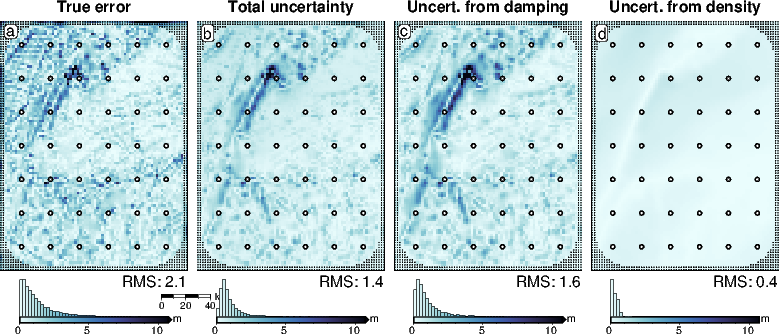

In [19]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
]

grids = [
    np.abs(stochastic_mean - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
]
sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=4,
    fname=f"../paper/figures/Ross_Sea_0{i}_sensitivity.png",
)

## 2: with noise

In [20]:
i = 2
final_bathymetry = final_bathymetries[i - 1]
inversion_results = optimal_results[i - 1]

damping_study = damping_studies[i - 1]
density_study = density_studies[i - 1]

constraint_points = pd.read_csv(
    f"../results/Ross_Sea/Ross_Sea_0{i}_constraint_points.csv"
)

uncertainty = final_uncertainties[i - 1]
stochastic_mean = final_stochastic_means[i - 1]

sensitivity_ds = sensitivity_results[i - 1]

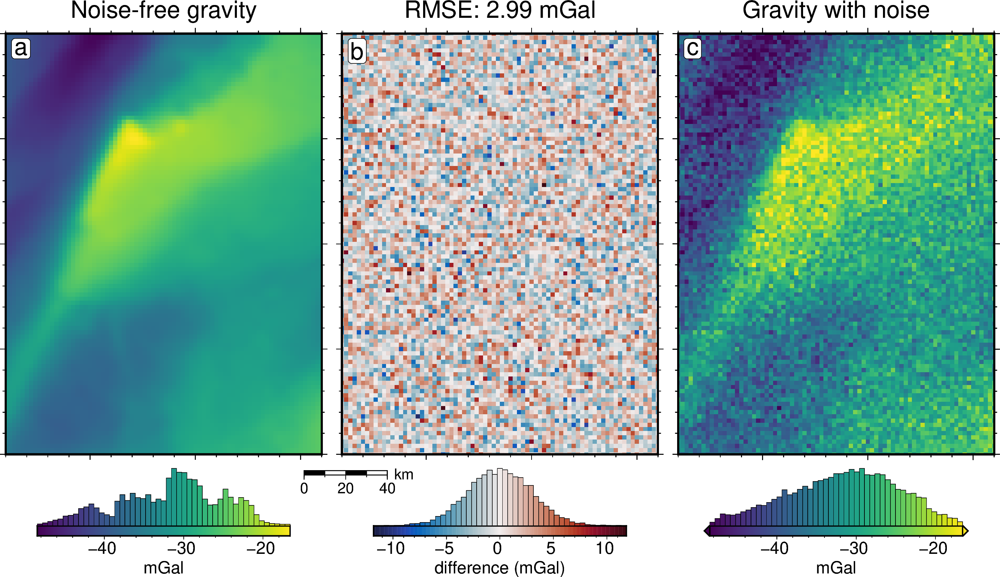

In [21]:
grav_df = inversion_results[1]

grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

lims = polar_utils.get_min_max(grav_grid.noise_free_disturbance)

# plot the noise-free gravity
fig = maps.plot_grd(
    grav_grid.noise_free_disturbance,
    fig_height=10,
    cpt_lims=lims,
    title="Noise-free gravity",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

dif = grav_grid.noise_free_disturbance - grav_grid.disturbance
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        dif,
        absolute=True,
    ),
    title=f"RMSE: {round(utils.rmse(dif), 2)} mGal",
    title_font="16p,Helvetica,black",
    cbar_label="difference (mGal)",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    scalebar=True,
    scalebar_position="jBL+o-.9c/-.6c",
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the noisey gravity
fig = maps.plot_grd(
    grav_grid.disturbance,
    fig_height=10,
    cpt_lims=lims,
    title="Gravity with noise",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
fig.show()

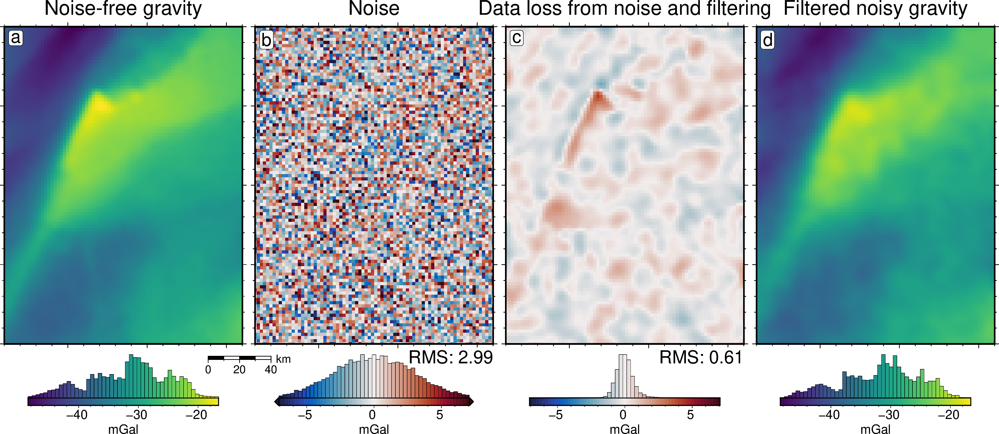

In [22]:
grav_df = inversion_results[1]

grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

lims = polar_utils.get_min_max(grav_grid.noise_free_disturbance)

# plot the noise-free gravity
fig = maps.plot_grd(
    grav_grid.noise_free_disturbance,
    fig_height=10,
    cpt_lims=lims,
    title="Noise-free gravity",
    title_font="18p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    scalebar=True,
    scalebar_position="jBR+o-.9c/-.6c",
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the difference between noise-free and noisy gravity
dif = grav_grid.noise_free_disturbance - grav_grid.disturbance
cpt_lims = polar_utils.get_min_max(
    dif,
    absolute=True,
    robust=True,
    robust_percentiles=(0.01, 0.99),
)
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=cpt_lims,
    title="Noise",
    title_font="18p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMS: {round(utils.rmse(dif), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the difference between noisy and filtered gravity
dif = grav_grid.noise_free_disturbance - grav_grid.gravity_anomaly
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=cpt_lims,
    title="Data loss from noise and filtering",
    title_font="18p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMS: {round(utils.rmse(dif), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the filtered gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    fig_height=10,
    cpt_lims=lims,
    title="Filtered noisy gravity",
    title_font="18p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="xshift",
)
fig.text(
    position="TL",
    text="d",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
fig.show()

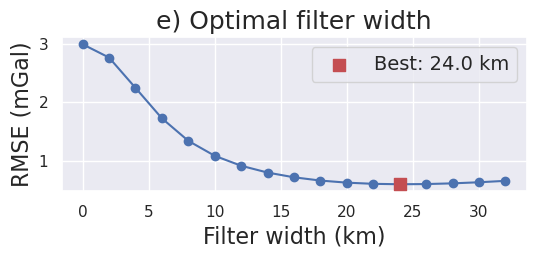

In [23]:
filter_widths_df = pd.read_csv(
    f"../results/Ross_Sea/Ross_Sea_0{i}_filter_width_rmse.csv"
)

_fig, ax = plt.subplots(figsize=(6, 2))
ax.plot(
    filter_widths_df.filt_width / 1e3,
    filter_widths_df.rmse,
    marker="o",
)

best_ind = filter_widths_df.rmse.idxmin()
ax.scatter(
    x=filter_widths_df.iloc[best_ind].filt_width / 1e3,
    y=filter_widths_df.iloc[best_ind].rmse,
    marker="s",
    color="r",
    s=80,
    zorder=20,
    label=f"Best: {round(filter_widths_df.iloc[best_ind].filt_width / 1e3, 2)} km",
)
ax.legend(fontsize=14)
ax.set_xlabel("Filter width (km)", fontsize=16)
ax.set_ylabel("RMSE (mGal)", fontsize=16)
ax.set_title("e) Optimal filter width", fontsize=18)

_fig.savefig(
    f"../paper/figures/Ross_Sea_0{i}_filters.png", dpi=300, bbox_inches="tight"
)

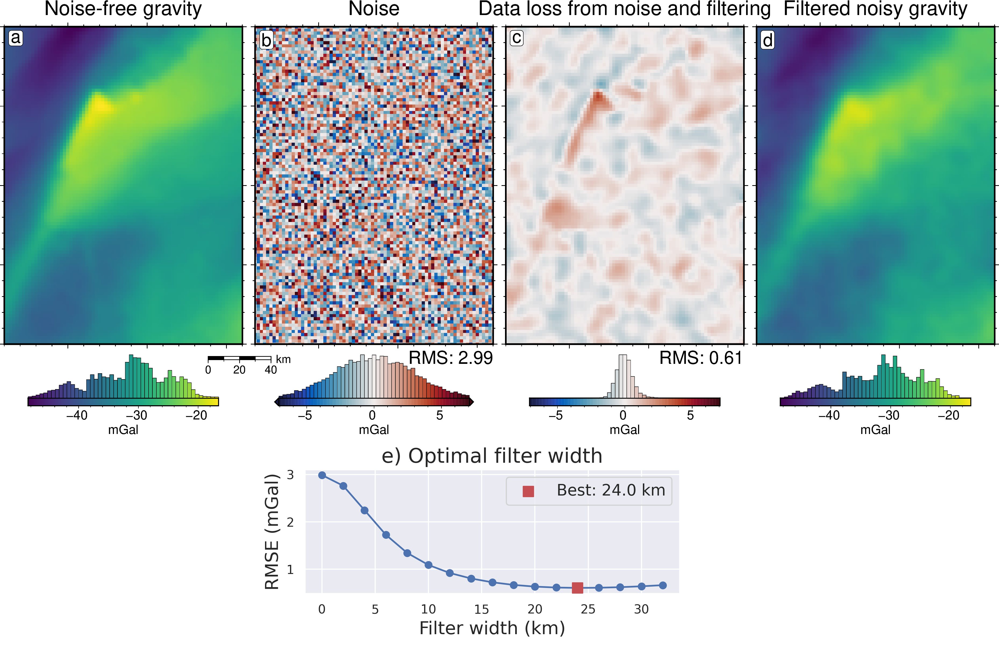

In [24]:
fig.image(
    imagefile=f"../paper/figures/Ross_Sea_0{i}_filters.png",
    position="n-2.1/-.3+jTL",
)
fig.savefig(f"../paper/figures/Ross_Sea_0{i}_grav_error.png")
fig.show()

In [25]:
grav_df = inversion_results[1]

noise = np.abs(grav_df.noise_free_disturbance - grav_df.disturbance)
noise.describe()

count    7676.000000
mean        2.387429
std         1.801864
min         0.000615
25%         0.955809
50%         2.028027
75%         3.421094
max        11.818300
dtype: float64

In [26]:
utils.rmse(noise)

np.float64(2.99100483668976)

In [27]:
grav_error = np.abs(grav_df.noise_free_disturbance - grav_df.gravity_anomaly)
grav_error.describe()

count    7676.000000
mean        0.463315
std         0.389367
min         0.000173
25%         0.181996
50%         0.369205
75%         0.642503
max         4.125650
dtype: float64

In [28]:
utils.rmse(grav_error)

np.float64(0.6051841170730238)

gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.


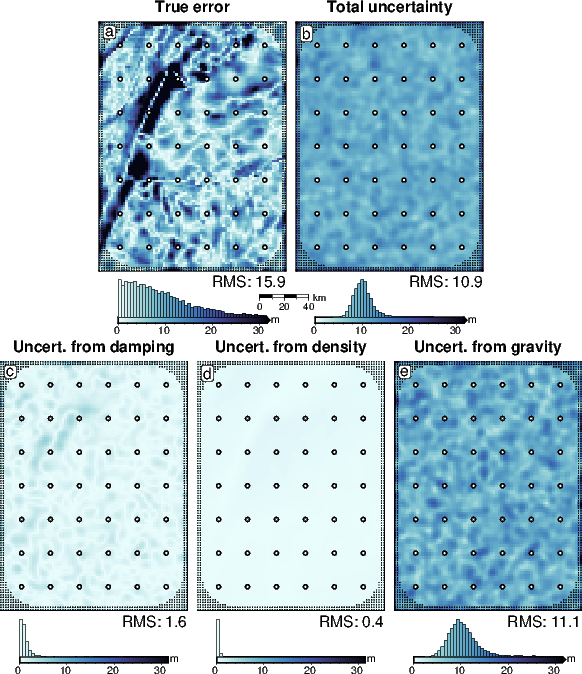

In [29]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
    "Uncert. from gravity",
]

grids = [
    np.abs(stochastic_mean - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
    sensitivity_ds.gravity_stdev,
]
sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=2,
    fname=f"../paper/figures/Ross_Sea_0{i}_sensitivity.png",
)

## 3: with airborne survey

In [30]:
i = 3
final_bathymetry = final_bathymetries[i - 1]
inversion_results = optimal_results[i - 1]

damping_study = damping_studies[i - 1]
density_study = density_studies[i - 1]

with pathlib.Path(f"../results/Ross_Sea/Ross_Sea_0{i}_eq_sources.pickle").open(
    "rb"
) as f:
    eqs_study = pickle.load(f)

constraint_points = pd.read_csv(
    f"../results/Ross_Sea/Ross_Sea_0{i}_constraint_points.csv"
)

uncertainty = final_uncertainties[i - 1]
stochastic_mean = final_stochastic_means[i - 1]

grav_df = pd.read_csv(f"../results/Ross_Sea/Ross_Sea_0{i}_grav_df.csv")

grav_survey_df = pd.read_csv(f"../results/Ross_Sea/Ross_Sea_0{i}_grav_survey_df.csv")

sensitivity_ds = sensitivity_results[i - 1]

In [31]:
grav_df.describe()

,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly_full_res,eqs_gravity_anomaly,gravity_anomaly_deterministic,starting_gravity,misfit,reg,res,predicted_grav,eqs_uncert,gravity_anomaly_eqs_mean,gravity_anomaly,uncert
count,7.676000e+03,7676.000000,7676.0,7676.000000,7676.0,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000
mean,-1.500000e+06,35000.000000,1000.0,-31.727281,0.0,-31.727281,-31.727281,-31.706558,-31.706558,-31.307367,-0.393674,-0.197494,-0.196180,-31.699659,0.053538,-31.701041,-31.701041,0.053538
std,5.831332e+04,43877.680138,0.0,6.458148,0.0,6.458148,6.458148,6.432334,6.432334,6.220031,1.237689,0.000000,1.237689,6.423451,0.076367,6.425508,6.425508,0.076367
min,-1.600000e+06,-40000.000000,1000.0,-48.457772,0.0,-48.457772,-48.457772,-48.094852,-48.094852,-48.209648,-7.268971,-0.197494,-7.071478,-48.134527,0.001516,-48.085594,-48.085594,0.001516
25%,-1.550000e+06,-2500.000000,1000.0,-36.286366,0.0,-36.286366,-36.286366,-36.308653,-36.308653,-35.436143,-0.755584,-0.197494,-0.558091,-36.285323,0.018445,-36.297954,-36.297954,0.018445
50%,-1.500000e+06,35000.000000,1000.0,-31.030069,0.0,-31.030069,-31.030069,-30.978656,-30.978656,-30.827291,-0.295344,-0.197494,-0.097850,-30.980281,0.031697,-30.977286,-30.977286,0.031697
75%,-1.450000e+06,72500.000000,1000.0,-27.278975,0.0,-27.278975,-27.278975,-27.240553,-27.240553,-26.861446,0.038455,-0.197494,0.235949,-27.233120,0.056035,-27.237610,-27.237610,0.056035
max,-1.400000e+06,110000.000000,1000.0,-16.585798,0.0,-16.585798,-16.585798,-16.551546,-16.551546,-16.852773,5.599752,-0.197494,5.797246,-16.787896,0.833729,-16.734482,-16.734482,0.833729


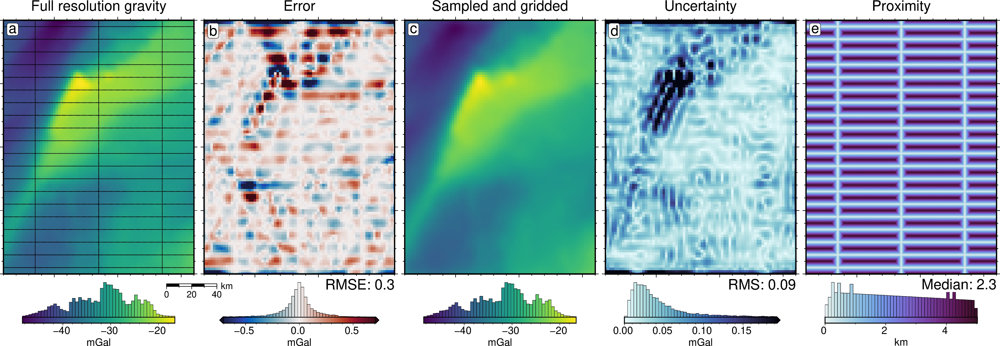

In [32]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

lims = polar_utils.get_min_max(grav_grid.gravity_anomaly_full_res)

# plot the noise-free gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly_full_res,
    fig_height=10,
    cpt_lims=lims,
    title="Full resolution gravity",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    scalebar=True,
    scalebar_position="jBR+o-.9c/-.6c",
)
# plot observation points
fig.plot(
    grav_survey_df[["easting", "northing"]],
    style="c.02c",
    fill="black",
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
dif = grav_grid.gravity_anomaly_full_res - grav_grid.gravity_anomaly
dif_lims = polar_utils.get_min_max(
    dif,
    absolute=True,
    robust=True,
)
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=dif_lims,
    title="Error",  # , RMSE: {round(utils.rmse(dif),1)} mGal",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMSE: {round(utils.rmse(dif), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# plot the noisey gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    fig_height=10,
    cpt_lims=lims,
    title="Sampled and gridded",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# plot the eq source uncertainty
fig = maps.plot_grd(
    grav_grid.uncert,
    fig_height=10,
    cpt_lims=(
        0,
        polar_utils.get_min_max(
            grav_grid.uncert,
            robust=True,
            robust_percentiles=(0.04, 0.96),
        )[1],
    ),
    cmap="ice",
    reverse_cpt=True,
    title="Uncertainty",  # , RMS: {round(utils.rmse(grav_grid.uncert),2)} mGal",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",  # , RMS: {round(utils.rmse(grav_grid.uncert),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMS: {round(utils.rmse(grav_grid.uncert), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    position="TL",
    text="d",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

coords = vd.grid_coordinates(
    region=inversion_region,
    spacing=100,
)
grid = vd.make_xarray_grid(coords, np.ones_like(coords[0]), data_names="z").z
min_dist = (
    utils.dist_nearest_points(
        grav_survey_df,
        grid,
    ).min_dist
    / 1e3
)

fig = maps.plot_grd(
    min_dist,
    fig_height=10,
    cpt_lims=(
        0,
        polar_utils.get_min_max(
            min_dist,
        )[1],
    ),
    cmap="dense",
    title="Proximity",  # , median: {round(np.median(min_dist),2)} km",
    title_font="16p,Helvetica,black",
    cbar_label="km",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"Median: {round(np.median(min_dist), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    position="TL",
    text="e",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
fig.savefig(f"../paper/figures/Ross_Sea_0{i}_grav_error.png")
fig.show()

In [33]:
df = eqs_study.trials_dataframe().sort_values("value").reset_index(drop=True)
df = df.iloc[2:].reset_index(drop=True)
df = df.drop(3).reset_index(drop=True)
df

,number,value,datetime_start,datetime_complete,duration,params_damping,params_depth,system_attrs_fixed_params,state
0,7,0.975067,2025-10-14 14:30:30.659713,2025-10-14 14:30:33.377640,0 days 00:00:02.717927,0.098499,72439.765810,NaN,COMPLETE
1,3,0.976299,2025-10-14 14:30:01.380711,2025-10-14 14:30:06.333186,0 days 00:00:04.952475,0.762644,59952.265810,NaN,COMPLETE
2,5,0.976426,2025-10-14 14:30:12.405263,2025-10-14 14:30:21.988305,0 days 00:00:09.583042,0.004572,84927.265810,NaN,COMPLETE
3,4,0.994434,2025-10-14 14:30:06.340498,2025-10-14 14:30:12.401418,0 days 00:00:06.060920,0.035399,34977.265810,NaN,COMPLETE
4,6,0.995391,2025-10-14 14:30:22.019279,2025-10-14 14:30:30.658220,0 days 00:00:08.638941,2.122102,22489.765810,NaN,COMPLETE
5,9,0.999350,2025-10-14 14:30:40.258524,2025-10-14 14:30:48.611805,0 days 00:00:08.353281,0.411685,14173.067440,NaN,COMPLETE
6,8,0.999677,2025-10-14 14:30:33.405174,2025-10-14 14:30:40.256842,0 days 00:00:06.851668,0.001000,19115.478929,NaN,COMPLETE
7,11,0.999952,2025-10-14 14:30:58.998486,2025-10-14 14:31:05.847557,0 days 00:00:06.849071,0.001000,13499.630288,NaN,COMPLETE
8,2,0.999986,2025-10-14 14:29:56.771327,2025-10-14 14:30:01.375794,0 days 00:00:04.604467,0.001643,10002.265810,NaN,COMPLETE


In [34]:
spline = vd.Spline(damping=None)
coords = (
    df.params_depth,
    df.params_damping,
)
spline.fit(
    coords,
    df.value,
)
grid_coords = vd.grid_coordinates(
    region=vd.get_region(coords),
    shape=(100, 100),
    pixel_register=True,
)
grid = vd.make_xarray_grid(
    grid_coords,
    data=np.ones_like(grid_coords[0]),
    data_names="data",
    dims=("damping", "depth"),  # these need to be swapped
).data
score_df = vd.grid_to_table(grid).drop(columns="data")

score_df["score"] = spline.predict((score_df.damping, score_df.depth))

grid = score_df.set_index(["damping", "depth"]).to_xarray().score

In [35]:
df

,number,value,datetime_start,datetime_complete,duration,params_damping,params_depth,system_attrs_fixed_params,state
0,7,0.975067,2025-10-14 14:30:30.659713,2025-10-14 14:30:33.377640,0 days 00:00:02.717927,0.098499,72439.765810,NaN,COMPLETE
1,3,0.976299,2025-10-14 14:30:01.380711,2025-10-14 14:30:06.333186,0 days 00:00:04.952475,0.762644,59952.265810,NaN,COMPLETE
2,5,0.976426,2025-10-14 14:30:12.405263,2025-10-14 14:30:21.988305,0 days 00:00:09.583042,0.004572,84927.265810,NaN,COMPLETE
3,4,0.994434,2025-10-14 14:30:06.340498,2025-10-14 14:30:12.401418,0 days 00:00:06.060920,0.035399,34977.265810,NaN,COMPLETE
4,6,0.995391,2025-10-14 14:30:22.019279,2025-10-14 14:30:30.658220,0 days 00:00:08.638941,2.122102,22489.765810,NaN,COMPLETE
5,9,0.999350,2025-10-14 14:30:40.258524,2025-10-14 14:30:48.611805,0 days 00:00:08.353281,0.411685,14173.067440,NaN,COMPLETE
6,8,0.999677,2025-10-14 14:30:33.405174,2025-10-14 14:30:40.256842,0 days 00:00:06.851668,0.001000,19115.478929,NaN,COMPLETE
7,11,0.999952,2025-10-14 14:30:58.998486,2025-10-14 14:31:05.847557,0 days 00:00:06.849071,0.001000,13499.630288,NaN,COMPLETE
8,2,0.999986,2025-10-14 14:29:56.771327,2025-10-14 14:30:01.375794,0 days 00:00:04.604467,0.001643,10002.265810,NaN,COMPLETE


(-0.04142203060414228, 2.164523560811256)

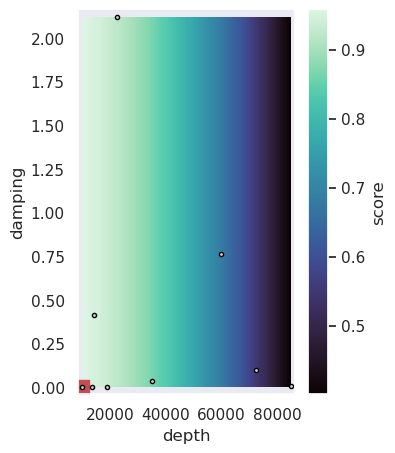

In [36]:
_fig, ax = plt.subplots(figsize=(3.5, 5))

grid.plot(
    cmap=sns.color_palette("mako", as_cmap=True),
    ax=ax,
)
best_ind = df.value.idxmax()
ax.scatter(
    y=df.iloc[best_ind].params_damping,
    x=df.iloc[best_ind].params_depth,
    marker="s",
    s=100,
    color="r",
    label="Best",
)
ax.scatter(
    y=df.params_damping,
    x=df.params_depth,
    marker=".",
    color="lightgray",
    edgecolor="black",
)
depth_range = df.params_depth.max() - df.params_depth.min()
ax.set_xlim(
    df.params_depth.min() - (depth_range * 0.02),
    df.params_depth.max() + (depth_range * 0.02),
)
damping_range = df.params_damping.max() - df.params_damping.min()
ax.set_ylim(
    df.params_damping.min() - (damping_range * 0.02),
    df.params_damping.max() + (damping_range * 0.02),
)

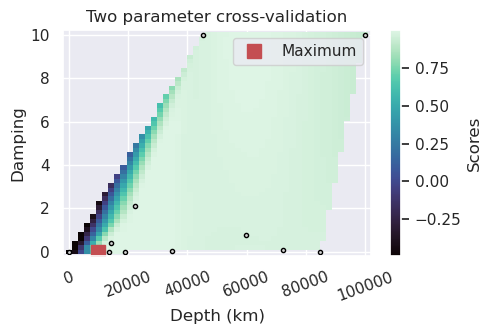

In [37]:
plotting.plot_2_parameter_cv_scores_uneven(
    eqs_study,
    param_names=(
        "params_depth",
        "params_damping",
    ),
    plot_param_names=(
        "Depth (km)",
        "Damping",
    ),
    best="max",
    robust=True,
)

In [38]:
grav_error = np.abs(grav_df.gravity_anomaly_full_res - grav_df.gravity_anomaly)
print(utils.rmse(grav_error))
grav_error.describe()

0.29555401447894813


count    7676.000000
mean        0.140733
std         0.259914
min         0.000016
25%         0.027358
50%         0.066101
75%         0.151545
max         4.329160
dtype: float64

gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.


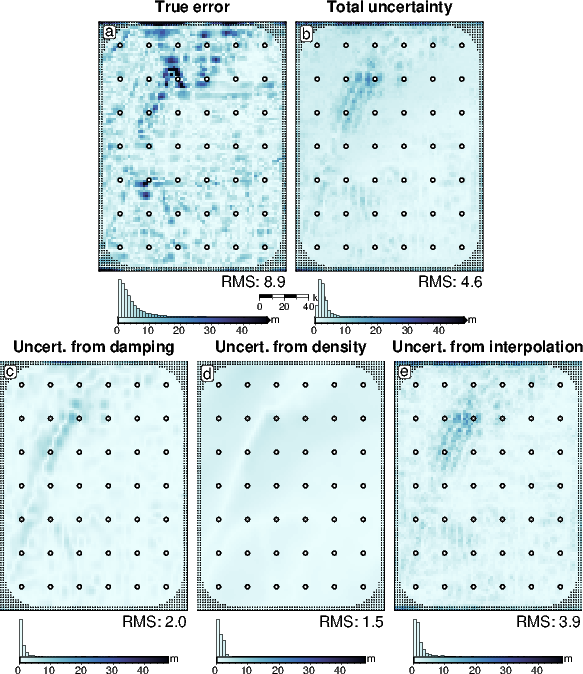

In [39]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
    "Uncert. from interpolation",
]

grids = [
    np.abs(stochastic_mean - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
    sensitivity_ds["equivalent source gridding_stdev"],
]
sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=2,
    fname=f"../paper/figures/Ross_Sea_0{i}_sensitivity.png",
)

## 4: with regional

In [18]:
i = 4
final_bathymetry = final_bathymetries[i - 1]
inversion_results = optimal_results[i - 1]

damping_study = damping_studies[i - 1]
density_study = density_studies[i - 1]

with pathlib.Path(
    f"../tmp_outputs/Ross_Sea_0{i}_regional_sep_true_density.pickle"
).open("rb") as f:
    regional_study = pickle.load(f)

constraint_points = pd.read_csv(
    f"../results/Ross_Sea/Ross_Sea_0{i}_constraint_points.csv"
)

uncertainty = final_uncertainties[i - 1]
stochastic_mean = final_stochastic_means[i - 1]

grav_df = pd.read_csv(f"../results/Ross_Sea/Ross_Sea_0{i}_grav_df_true_density.csv")

sensitivity_ds = sensitivity_results[i - 1]

In [19]:
grav_df.head()

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly,starting_gravity,true_res,misfit,reg,res,reg_uncert
0,-1600000.0,-40000.0,1000.0,-35.551054,-0.575610,-36.298772,-71.849826,-35.578561,-3.009687,-36.271265,-36.352514,0.081249,0.196374
1,-1600000.0,-38000.0,1000.0,-36.054657,-0.523194,-33.940048,-69.994704,-36.042642,-3.088826,-33.952063,-33.935629,-0.016434,0.082311
2,-1600000.0,-36000.0,1000.0,-36.473146,-0.466341,-31.381660,-67.854806,-36.460095,-3.125498,-31.394711,-31.343652,-0.051059,0.058318
3,-1600000.0,-34000.0,1000.0,-36.755608,-0.406001,-28.666395,-65.422003,-36.784649,-3.111113,-28.637354,-28.615142,-0.022212,0.076759
4,-1600000.0,-32000.0,1000.0,-36.951029,-0.343146,-25.837899,-62.788928,-36.998469,-3.110966,-25.790460,-25.788302,-0.002158,0.084586


In [20]:
# calculate the true residual and regional misfit
grav_df["true_res"] = grav_df.bathymetry_grav - grav_df.starting_gravity
grav_df["true_reg"] = grav_df.basement_grav
grav_df.head()

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly,starting_gravity,true_res,misfit,reg,res,reg_uncert,true_reg
0,-1600000.0,-40000.0,1000.0,-35.551054,-0.575610,-36.298772,-71.849826,-35.578561,0.027507,-36.271265,-36.352514,0.081249,0.196374,-36.298772
1,-1600000.0,-38000.0,1000.0,-36.054657,-0.523194,-33.940048,-69.994704,-36.042642,-0.012015,-33.952063,-33.935629,-0.016434,0.082311,-33.940048
2,-1600000.0,-36000.0,1000.0,-36.473146,-0.466341,-31.381660,-67.854806,-36.460095,-0.013051,-31.394711,-31.343652,-0.051059,0.058318,-31.381660
3,-1600000.0,-34000.0,1000.0,-36.755608,-0.406001,-28.666395,-65.422003,-36.784649,0.029040,-28.637354,-28.615142,-0.022212,0.076759,-28.666395
4,-1600000.0,-32000.0,1000.0,-36.951029,-0.343146,-25.837899,-62.788928,-36.998469,0.047440,-25.790460,-25.788302,-0.002158,0.084586,-25.837899


In [21]:
print(f"MA of regional: {np.abs(grav_df.reg).mean()}")
print(f"RMS of regional: {utils.rmse(grav_df.reg)}")
print(f"MAE of regional: {np.abs(grav_df.true_reg - grav_df.reg).mean()}")
print(f"RMSE of regional: {utils.rmse(grav_df.true_reg - grav_df.reg)}")
print(f"Max regional error: {np.abs(grav_df.true_reg - grav_df.reg).max()}")

MA of regional: 15.359499569436794
RMS of regional: 18.35363723599696
MAE of regional: 0.3368661422817604
RMSE of regional: 0.4687092556750809
Max regional error: 2.754957899309744


In [22]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

grav_grid["true_reg"] = grav_grid.basement_grav

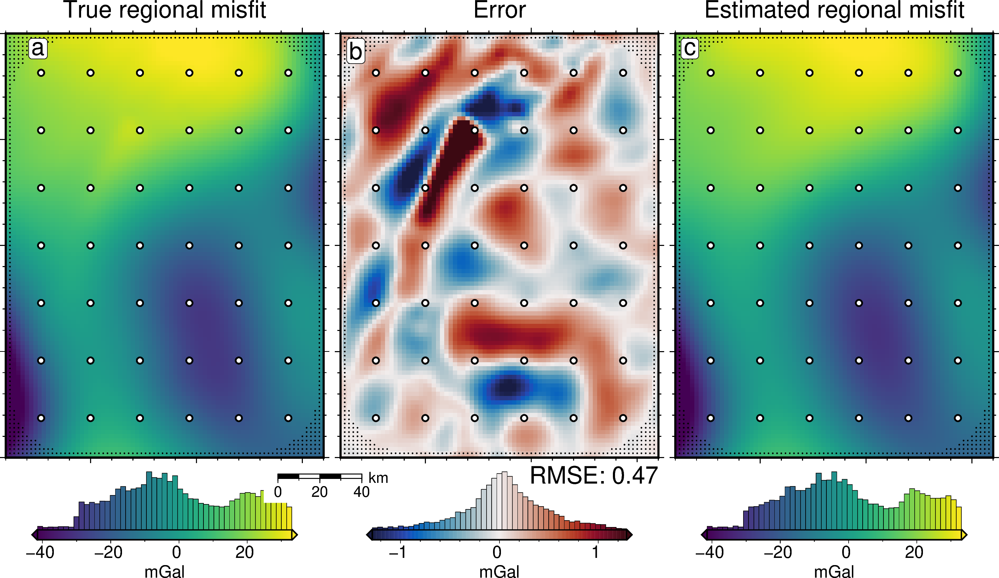

In [14]:
reg_lims = polar_utils.get_combined_min_max(
    [grav_grid.true_reg, grav_grid.reg],
    robust=True,
    robust_percentiles=(0.01, 0.99),
)
fig = maps.plot_grd(
    grav_grid.true_reg,
    fig_height=10,
    cmap="viridis",
    cpt_lims=reg_lims,
    title="True regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
    scalebar=True,
    scalebar_position="jBR+o-.9c/-.6c",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.6/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the regional error
dif = grav_grid.true_reg - grav_grid.reg
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        dif,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="Error",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",  # f"mGal, RMSE: {round(utils.rmse(dif),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMSE: {round(utils.rmse(dif), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the true regional misfit
fig = maps.plot_grd(
    grav_grid.reg,
    fig_height=10,
    cpt_lims=reg_lims,
    cmap="viridis",
    title="Estimated regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
fig.show()

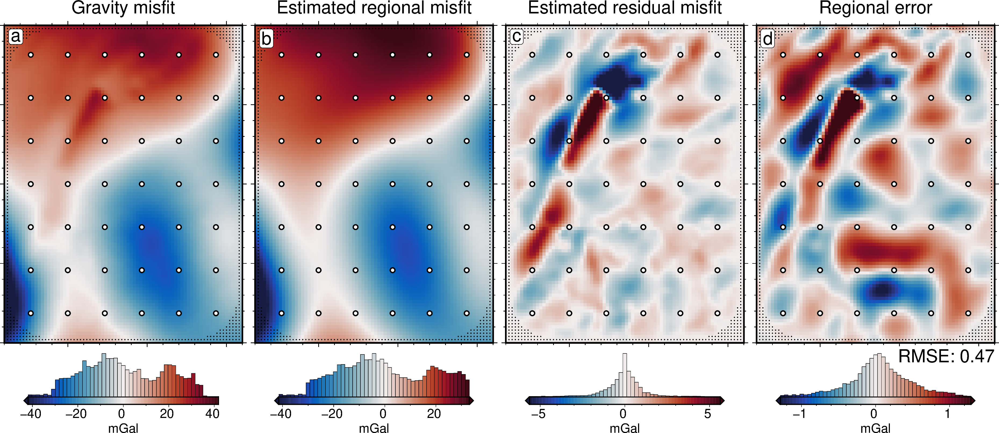

In [46]:
# plot gravity misfit
dif = grav_grid.gravity_anomaly - grav_grid.starting_gravity
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        dif,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="Gravity misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the estimated regional
reg_lims = polar_utils.get_combined_min_max(
    [grav_grid.true_reg, grav_grid.reg],
    robust=True,
    robust_percentiles=(0.01, 0.99),
)
fig = maps.plot_grd(
    grav_grid.reg,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=reg_lims,
    title="Estimated regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)

fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the estimated residual
fig = maps.plot_grd(
    grav_grid.res,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        grav_grid.res,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="Estimated residual misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)


# plot the regional error
dif = grav_grid.true_reg - grav_grid.reg
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        dif,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="Regional error",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",  # f"mGal, RMSE: {round(utils.rmse(dif),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMSE: {round(utils.rmse(dif), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="d",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
fig.show()

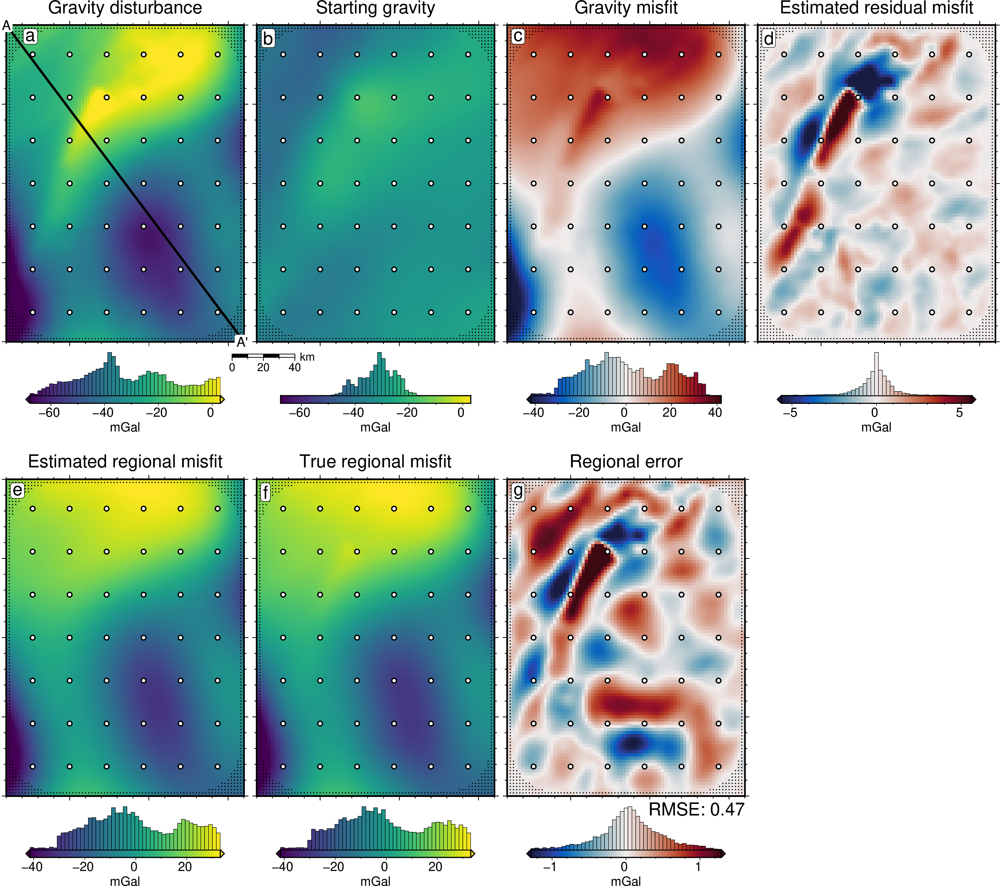

In [47]:
lims = polar_utils.get_min_max(
    grav_grid.gravity_anomaly,
    robust=True,
)

# plot the observed gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    fig_height=10,
    cpt_lims=lims,
    title="Gravity disturbance",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    scalebar=True,
    scalebar_position="jBR+o-1.6c/-.6c",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
# plot profiles location, and endpoints on map
fig.plot(
    vd.line_coordinates(profile_start, profile_end, size=100),
    pen="2p,black",
)
fig.text(
    x=profile_start[0],
    y=profile_start[1],
    text="A",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    x=profile_end[0],
    y=profile_end[1],
    text="A' ",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.6/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the starting gravity
fig = maps.plot_grd(
    grav_grid.starting_gravity,
    fig_height=10,
    cpt_lims=lims,
    title="Starting gravity",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot gravity misfit
dif = grav_grid.gravity_anomaly - grav_grid.starting_gravity
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        dif,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="Gravity misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the estimated residual
fig = maps.plot_grd(
    grav_grid.res,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        grav_grid.res,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="Estimated residual misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="d",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the estimated regional
reg_lims = polar_utils.get_combined_min_max(
    [grav_grid.true_reg, grav_grid.reg],
    robust=True,
    robust_percentiles=(0.01, 0.99),
)
fig = maps.plot_grd(
    grav_grid.reg,
    fig_height=10,
    cmap="viridis",
    cpt_lims=reg_lims,
    title="Estimated regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="both",
    xshift_amount=-3,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)

fig.text(
    position="TL",
    text="e",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the true regional misfit
fig = maps.plot_grd(
    grav_grid.true_reg,
    fig_height=10,
    cmap="viridis",
    cpt_lims=reg_lims,
    title="True regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="f",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the regional error
dif = grav_grid.true_reg - grav_grid.reg
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        dif,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="Regional error",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",  # f"mGal, RMSE: {round(utils.rmse(dif),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMSE: {round(utils.rmse(dif), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="g",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
fig.show()

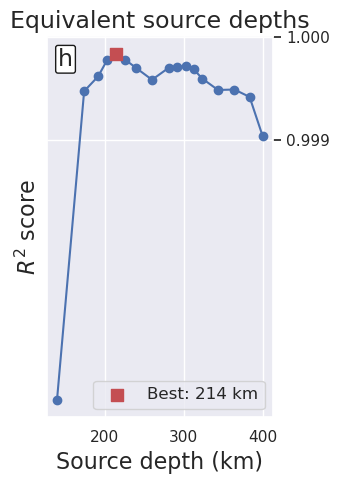

In [48]:
df = regional_study.trials_dataframe().sort_values("params_depth")
df = df.iloc[3:].reset_index(drop=True)

_fig, ax = plt.subplots(figsize=(3.5, 5))
ax.plot(
    df.params_depth / 1e3,
    df.value,
    marker="o",
)

best_ind = df.value.idxmax()
ax.scatter(
    x=df.iloc[best_ind].params_depth / 1e3,
    y=df.iloc[best_ind].value,
    marker="s",
    color="r",
    s=80,
    zorder=20,
    label=f"Best: {round(df.iloc[best_ind].params_depth / 1e3)} km",
)

ax.legend(fontsize=12)
ax.set_xlabel("Source depth (km)", fontsize=16)
ax.set_ylabel("$R^2$ score", fontsize=16)
ax.set_title("Equivalent source depths", fontsize=17)

ax.annotate(
    "h",
    xy=(0.05, 0.97),
    xycoords="axes fraction",
    fontsize=17,
    va="top",
    ha="left",
    bbox=dict(boxstyle="round,pad=0.1", facecolor="white", edgecolor="k", pad=3.0),
)

ax.set_yticks([0.999, 1])
ax.yaxis.tick_right()
ax.yaxis.set_major_formatter(mpl.ticker.FormatStrFormatter("%.3f"))

_fig.tight_layout()
_fig.savefig(
    f"../paper/figures/Ross_Sea_0{i}_eq_sources.png", dpi=300, bbox_inches="tight"
)

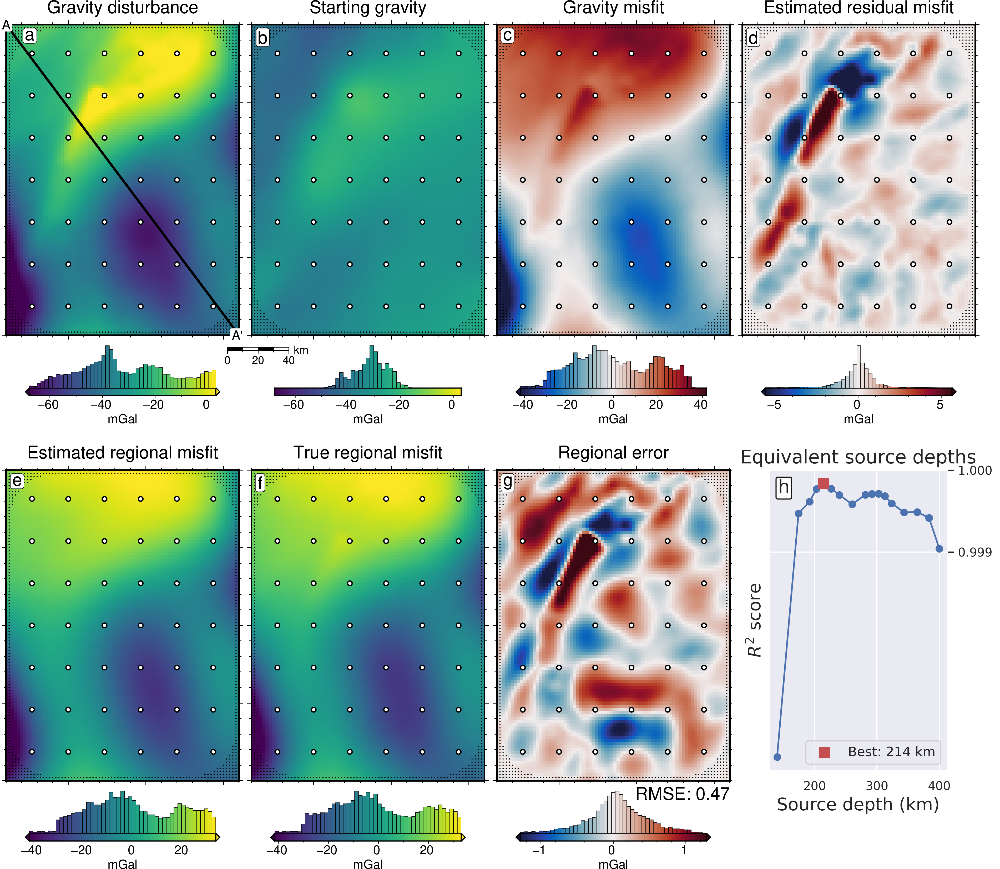

In [49]:
fig.image(
    imagefile=f"../paper/figures/Ross_Sea_0{i}_eq_sources.png",
    position="n1.01/.48+jML",
)
fig.savefig(f"../paper/figures/Ross_Sea_0{i}_grav_anomalies.png")
fig.show()

grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).


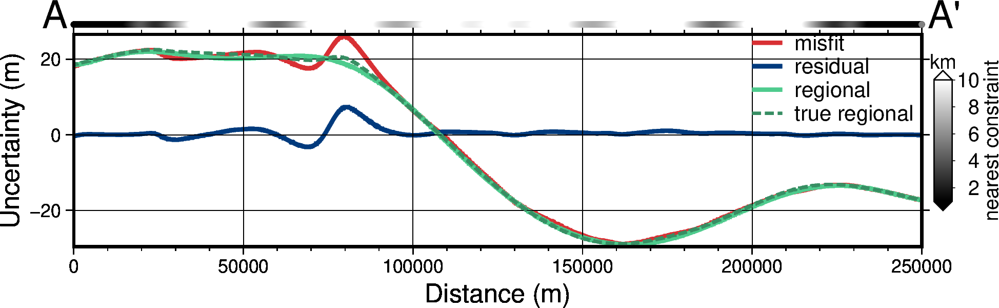

In [20]:
titles = [
    "misfit",
    "residual",
    "regional",
    "true regional",
]
grids = [
    grav_grid.misfit,
    grav_grid.res,
    grav_grid.reg,
    grav_grid.true_reg,
]
data_ylims = None
data_dict = profiles.make_data_dict(
    names=titles,
    grids=grids,
    colors=[  # https://www.simplifiedsciencepublishing.com/resources/best-color-palettes-for-scientific-figures-and-data-visualizations
        "216/48/52",  # red, d83034
        "0/58/125",  # dark blue, 003a7d
        "78/203/141",  # green, 4ecb8d
        f"{78 * 0.7}/{203 * 0.7}/{141 * 0.7}",  # green, darker than above
        # "199/1/255", # purple, c701ff
        # "255/157/58", # orange, ff9d3a
        # "0/141/255", # med blue, 008dff
        # "255/115/182", # pink, ff73b6
        # "249/232/88", # yellow, f9e858
    ],
)

fig, df_data = profiles.plot_data(
    "points",
    start=profile_start,
    stop=profile_end,
    num=10000,
    fig_height=4,
    fig_width=14,
    data_dict=data_dict,
    data_legend_loc="jTR+o0c/-.2c",
    data_buffer=0.01,
    data_frame=["neSW", "xafg+lDistance (m)", "yag+lUncertainty (m)"],
    data_pen_style=[None, None, None, "4_2:2p"],
    data_pen_thickness=[2, 2, 2, 1.5],
    share_yaxis=True,
    start_label="A",
    end_label="A' ",
)

# get grid of min dists to nearest constraints
min_dist = utils.normalized_mindist(
    constraint_points,
    grids[0],
)

# set y height in data units for add dist to constraint points
data_max = df_data.drop(columns=["easting", "northing", "dist"]).max().max()

if data_ylims is not None:
    data_max = data_ylims[1]

df_data = profiles.sample_grids(
    df_data, min_dist, interpolation="b", sampled_name="min_dist"
)
# set color limits
series = [1e3, 10e3]

pygmt.makecpt(
    cmap="gray",
    series=series,
    background=True,
)
fig.shift_origin(
    yshift=".2c",
)
fig.plot(
    x=df_data.dist,
    y=np.ones_like(df_data.dist) * data_max,
    style="c0.1c",
    fill=df_data.min_dist,
    cmap=True,
    no_clip=True,
)
fig.shift_origin(
    yshift="-.2c",
)
with pygmt.config(
    FONT="26p,Helvetica,black",
):
    fig.colorbar(
        cmap=True,
        position="jMR+w2c/.3c+jML+v+o0.2c/0c+e",
        frame=["xa+lnearest constraint", "y+lkm"],
        scale=0.001,
    )
fig.savefig(f"../paper/figures/Ross_Sea_0{i}_grav_anomalies_profiles.png")
fig.show()

In [51]:
np.abs(dif).mean(), np.abs(dif).max()

(<xarray.DataArray ()> Size: 8B
 array(0.33686614),
 <xarray.DataArray ()> Size: 8B
 array(2.7549579))

gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.


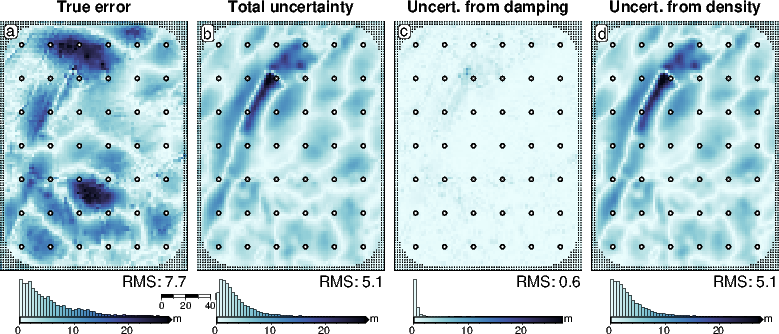

In [52]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
]

grids = [
    np.abs(stochastic_mean - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
]
sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=4,
    fname=f"../paper/figures/Ross_Sea_0{i}_sensitivity.png",
)

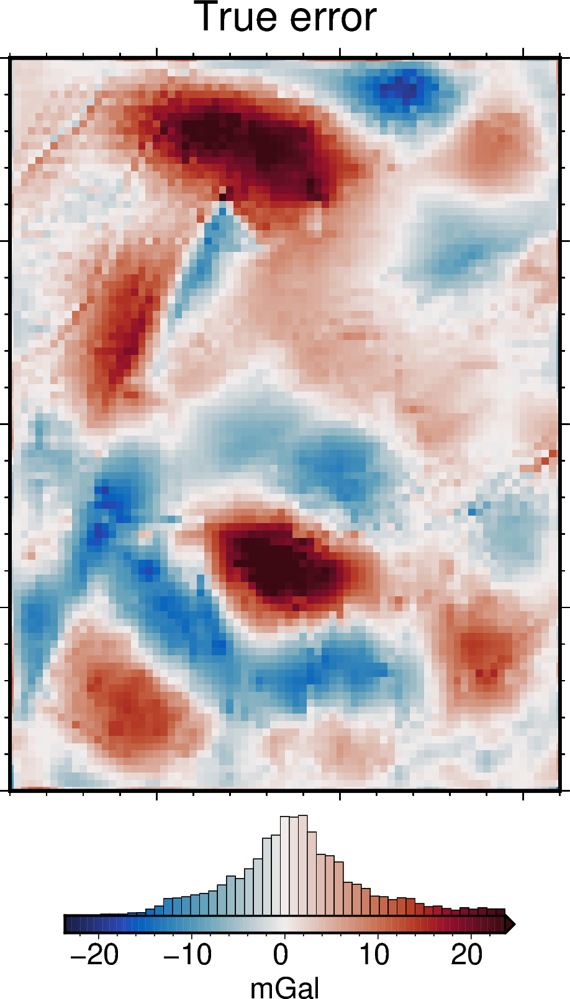

In [53]:
err = final_bathymetry - bathymetry
fig = maps.plot_grd(
    err,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        err,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="True error",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
)
fig.show()

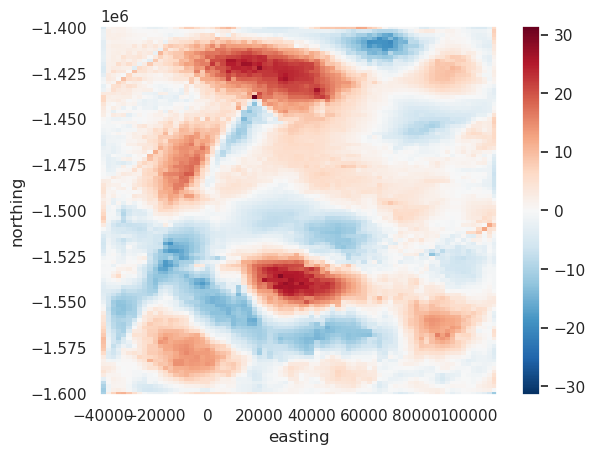

In [54]:
err.plot()

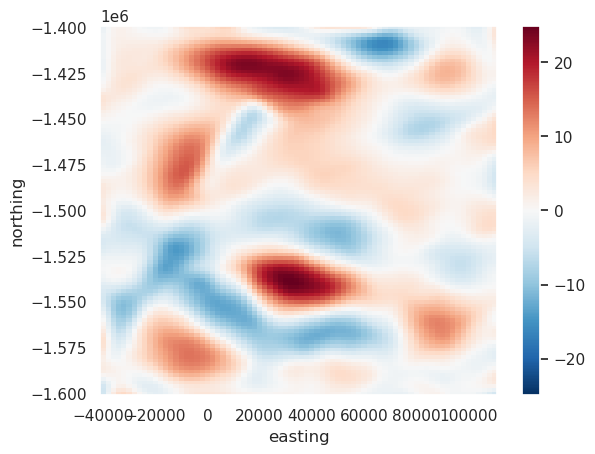

In [55]:
filt = utils.filter_grid(err, 20e3)
filt.plot()

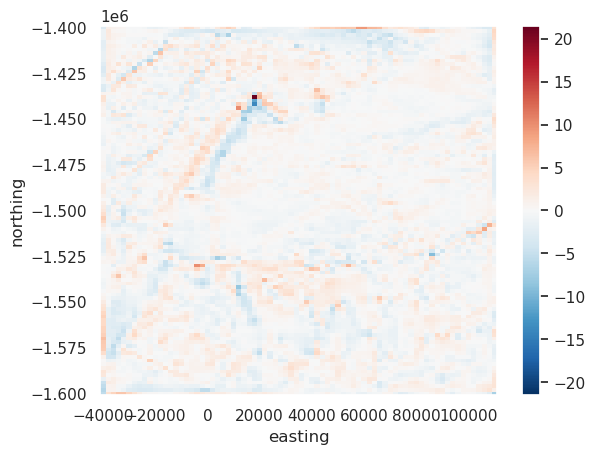

In [56]:
filt2 = utils.filter_grid(err, 20e3, filt_type="highpass")
filt2.plot()

## 5: Realistic scenario

In [23]:
i = 5
final_bathymetry = final_bathymetries[i - 1]
inversion_results = optimal_results[i - 1]

damping_study = damping_studies[i - 1]
density_study = density_studies[i - 1]

with pathlib.Path(
    f"../tmp_outputs/Ross_Sea_0{i}_regional_sep_true_density.pickle"
).open("rb") as f:
    regional_study = pickle.load(f)

constraint_points = pd.read_csv(
    f"../results/Ross_Sea/Ross_Sea_0{i}_constraint_points.csv"
)

uncertainty = final_uncertainties[i - 1]
stochastic_mean = final_stochastic_means[i - 1]

grav_df = pd.read_csv(f"../results/Ross_Sea/Ross_Sea_0{i}_grav_df_true_density.csv")

eqs_uncert = pd.read_csv(f"../results/Ross_Sea/Ross_Sea_0{i}_grav_df.csv")["eqs_uncert"]
grav_df["eqs_uncert"] = eqs_uncert

sensitivity_ds = sensitivity_results[i - 1]

(array([  13.,  105.,  352., 1487., 2836., 2011.,  690.,  146.,   32.,
           4.]),
 array([-93.60144085, -73.29190458, -52.98236831, -32.67283205,
        -12.36329578,   7.94624049,  28.25577676,  48.56531303,
         68.87484929,  89.18438556, 109.49392183]),
 <BarContainer object of 10 artists>)

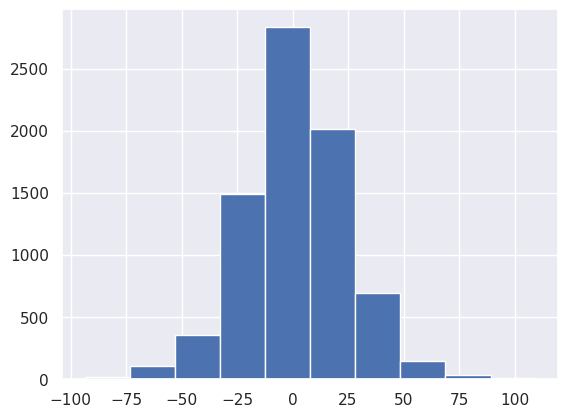

In [24]:
(final_bathymetry - bathymetry).plot.hist()

In [59]:
(starting_bathymetry - bathymetry).to_numpy().max()

np.float64(164.39923609925518)

In [60]:
(final_bathymetry - bathymetry).to_numpy().max()

np.float64(109.49392183017909)

In [61]:
grav_df.head()

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly_full_res_no_noise,gravity_anomaly_full_res,uncert,eqs_gravity_anomaly,gravity_anomaly,starting_gravity,true_res,misfit,reg,res,reg_uncert,eqs_uncert
0,-1600000.0,-40000.0,1000.0,-35.551085,-0.575645,-36.300394,-71.851479,-72.911198,3,-64.481389,-64.481389,-35.578561,-3.009718,-28.902828,-29.704963,0.802136,0.314038,1.537731
1,-1600000.0,-38000.0,1000.0,-36.054683,-0.523223,-33.941405,-69.996088,-72.483909,3,-64.163085,-64.163085,-36.042642,-3.088852,-28.120443,-28.604746,0.484303,0.228852,1.318696
2,-1600000.0,-36000.0,1000.0,-36.473168,-0.466365,-31.382798,-67.855967,-68.870245,3,-63.178870,-63.178870,-36.460095,-3.125521,-26.718775,-27.043474,0.324699,0.287741,1.168135
3,-1600000.0,-34000.0,1000.0,-36.755627,-0.406022,-28.667352,-65.422980,-61.536475,3,-61.636021,-61.636021,-36.784649,-3.111132,-24.851373,-25.130963,0.279591,0.298262,0.998435
4,-1600000.0,-32000.0,1000.0,-36.951045,-0.343163,-25.838709,-62.789754,-65.528788,3,-59.623519,-59.623519,-36.998469,-3.110982,-22.625050,-22.965266,0.340216,0.269691,0.823200


In [25]:
grav_error = np.abs(grav_df.gravity_anomaly_full_res_no_noise - grav_df.gravity_anomaly)
print(
    f"MAE of gravity: {np.abs(grav_df.gravity_anomaly_full_res_no_noise - grav_df.gravity_anomaly).mean()}"
)
print(
    f"RMSE of gravity: {utils.rmse(grav_df.gravity_anomaly_full_res_no_noise - grav_df.gravity_anomaly)}"
)
grav_error.describe()

MAE of gravity: 0.8472477774320722
RMSE of gravity: 1.135396522721251


count    7676.000000
mean        0.847248
std         0.755891
min         0.000369
25%         0.302118
50%         0.651053
75%         1.179984
max         8.188145
dtype: float64

In [26]:
# calculate the true residual and regional misfit
grav_df["true_res"] = grav_df.bathymetry_grav - grav_df.starting_gravity
grav_df["true_reg"] = grav_df.basement_grav
grav_df.head()

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly_full_res_no_noise,gravity_anomaly_full_res,uncert,eqs_gravity_anomaly,gravity_anomaly,starting_gravity,true_res,misfit,reg,res,reg_uncert,eqs_uncert,true_reg
0,-1600000.0,-40000.0,1000.0,-35.551085,-0.575645,-36.300394,-71.851479,-72.911198,3,-64.481389,-64.481389,-35.578561,0.027476,-28.902828,-29.704963,0.802136,0.314038,1.537731,-36.300394
1,-1600000.0,-38000.0,1000.0,-36.054683,-0.523223,-33.941405,-69.996088,-72.483909,3,-64.163085,-64.163085,-36.042642,-0.012041,-28.120443,-28.604746,0.484303,0.228852,1.318696,-33.941405
2,-1600000.0,-36000.0,1000.0,-36.473168,-0.466365,-31.382798,-67.855967,-68.870245,3,-63.178870,-63.178870,-36.460095,-0.013073,-26.718775,-27.043474,0.324699,0.287741,1.168135,-31.382798
3,-1600000.0,-34000.0,1000.0,-36.755627,-0.406022,-28.667352,-65.422980,-61.536475,3,-61.636021,-61.636021,-36.784649,0.029021,-24.851373,-25.130963,0.279591,0.298262,0.998435,-28.667352
4,-1600000.0,-32000.0,1000.0,-36.951045,-0.343163,-25.838709,-62.789754,-65.528788,3,-59.623519,-59.623519,-36.998469,0.047423,-22.625050,-22.965266,0.340216,0.269691,0.823200,-25.838709


In [27]:
print(f"MA of regional: {np.abs(grav_df.reg).mean()}")
print(f"RMS of regional: {utils.rmse(grav_df.reg)}")
print(f"MAE of regional: {np.abs(grav_df.true_reg - grav_df.reg).mean()}")
print(f"RMSE of regional: {utils.rmse(grav_df.true_reg - grav_df.reg)}")
print(f"Max regional error: {np.abs(grav_df.true_reg - grav_df.reg).max()}")

MA of regional: 15.163261653873885
RMS of regional: 18.085531433319662
MAE of regional: 0.8972725248045438
RMSE of regional: 1.1826080946741815
Max regional error: 7.489381481647513


In [28]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

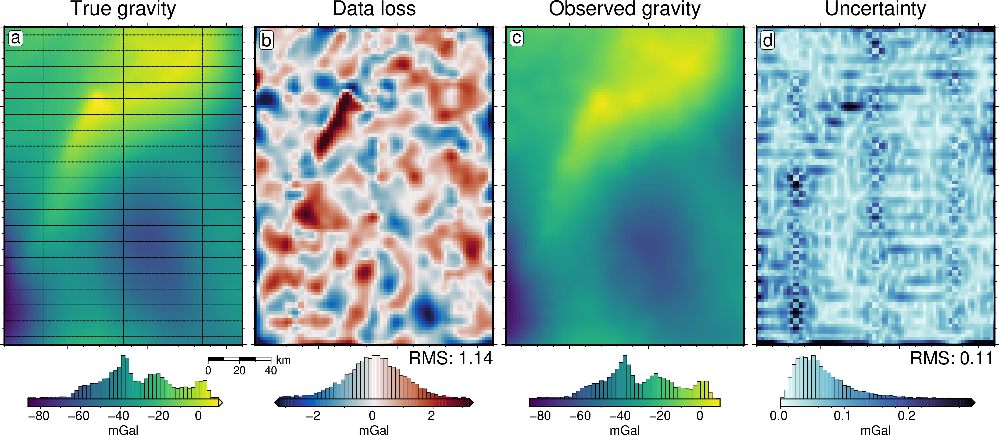

In [66]:
lims = polar_utils.get_min_max(grav_grid.gravity_anomaly_full_res_no_noise)

# plot the noise-free gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly_full_res_no_noise,
    fig_height=10,
    cpt_lims=lims,
    title="True gravity",
    title_font="18p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    scalebar=True,
    scalebar_position="jBR+o-.9c/-.6c",
)
# plot observation points
fig.plot(
    grav_survey_df[["easting", "northing"]],
    style="c.02c",
    fill="black",
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the difference between noisy and filtered gravity
dif = grav_grid.gravity_anomaly_full_res_no_noise - grav_grid.gravity_anomaly
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        dif,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="Data loss",
    title_font="18p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMS: {round(utils.rmse(dif), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the sampled, interpolated, and filtered gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    fig_height=10,
    cpt_lims=lims,
    title="Observed gravity",
    title_font="18p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="xshift",
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)


# plot the sampled, interpolated, and filtered gravity
fig = maps.plot_grd(
    grav_grid.eqs_uncert,
    fig_height=10,
    cpt_lims=(
        0,
        polar_utils.get_min_max(
            grav_grid.eqs_uncert,
            robust=True,
        )[1],
    ),
    cmap="ice",
    reverse_cpt=True,
    title="Uncertainty",  #: RMS: {round(utils.rmse(grav_grid.eqs_uncert),2)}",
    title_font="18p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMS: {round(utils.rmse(grav_grid.eqs_uncert), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    position="TL",
    text="d",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
fig.show()

In [67]:
filter_widths_df = pd.read_csv(
    f"../results/Ross_Sea/Ross_Sea_0{i}_filter_width_rmse.csv"
)

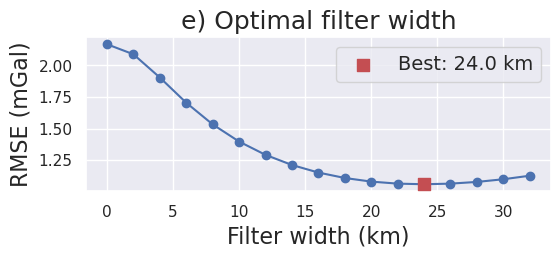

In [68]:
_fig, ax = plt.subplots(figsize=(6, 2))
ax.plot(
    filter_widths_df.filt_width / 1e3,
    filter_widths_df.rmse,
    marker="o",
)

best_ind = filter_widths_df.rmse.idxmin()
ax.scatter(
    x=filter_widths_df.iloc[best_ind].filt_width / 1e3,
    y=filter_widths_df.iloc[best_ind].rmse,
    marker="s",
    color="r",
    s=80,
    zorder=20,
    label=f"Best: {round(filter_widths_df.iloc[best_ind].filt_width / 1e3, 2)} km",
)
ax.legend(fontsize=14)
ax.set_xlabel("Filter width (km)", fontsize=16)
ax.set_ylabel("RMSE (mGal)", fontsize=16)
ax.set_title("e) Optimal filter width", fontsize=18)

_fig.savefig(
    f"../paper/figures/Ross_Sea_0{i}_filters.png", dpi=300, bbox_inches="tight"
)

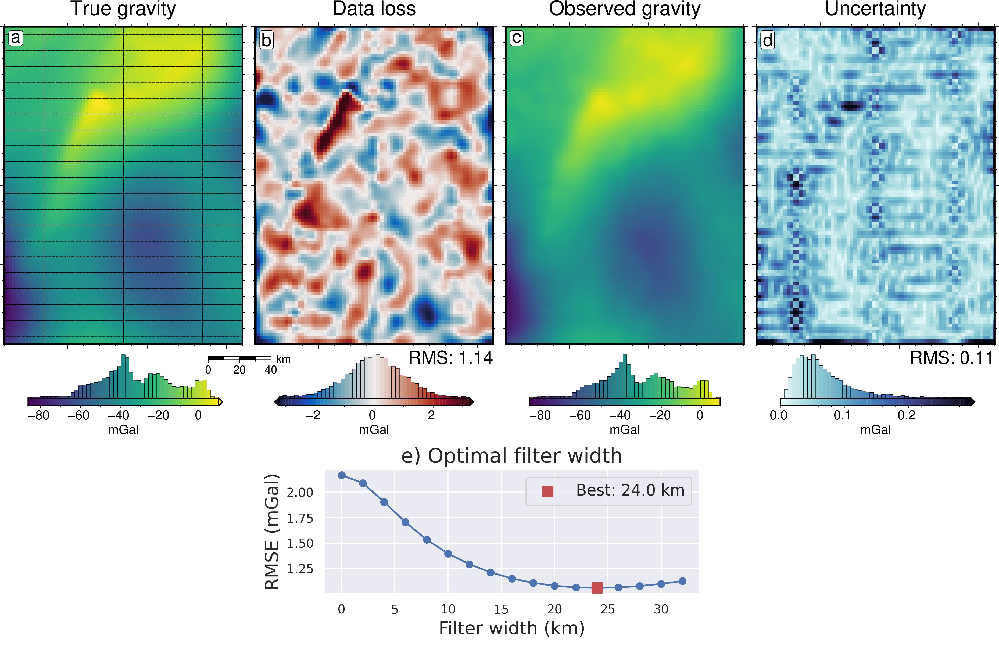

In [69]:
fig.image(
    imagefile=f"../paper/figures/Ross_Sea_0{i}_filters.png",
    position="n-2.1/-.3+jTL",
)
fig.savefig(f"../paper/figures/Ross_Sea_0{i}_grav_error.png")
fig.show()

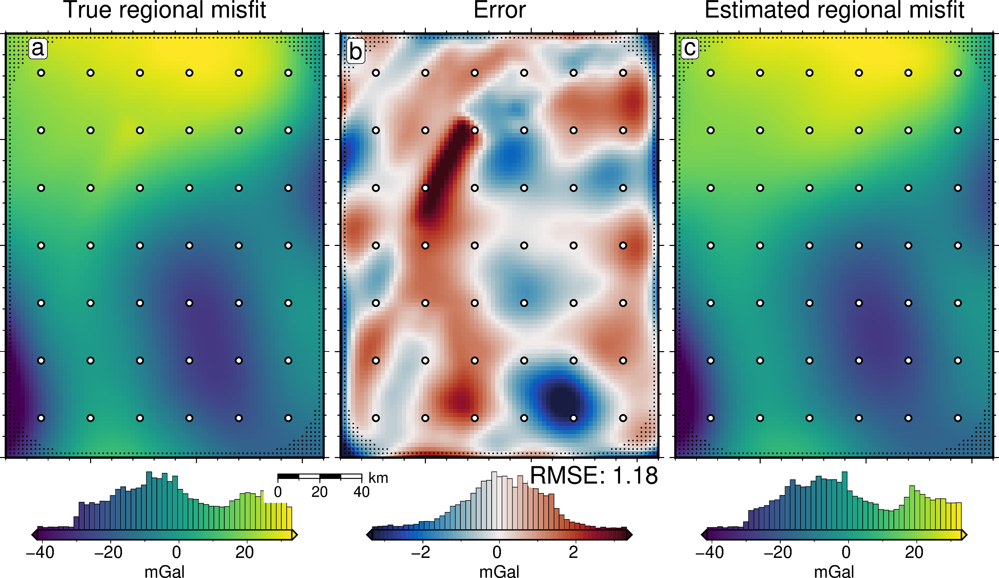

In [70]:
reg_lims = polar_utils.get_combined_min_max(
    [grav_grid.true_reg, grav_grid.reg],
    robust=True,
    robust_percentiles=(0.01, 0.99),
)
fig = maps.plot_grd(
    grav_grid.true_reg,
    fig_height=10,
    cmap="viridis",
    cpt_lims=reg_lims,
    title="True regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
    scalebar=True,
    scalebar_position="jBR+o-.9c/-.6c",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.6/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the regional error
dif = grav_grid.true_reg - grav_grid.reg
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        dif,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="Error",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",  # f"mGal, RMSE: {round(utils.rmse(dif),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMSE: {round(utils.rmse(dif), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the true regional misfit
fig = maps.plot_grd(
    grav_grid.reg,
    fig_height=10,
    cpt_lims=reg_lims,
    cmap="viridis",
    title="Estimated regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

fig.show()

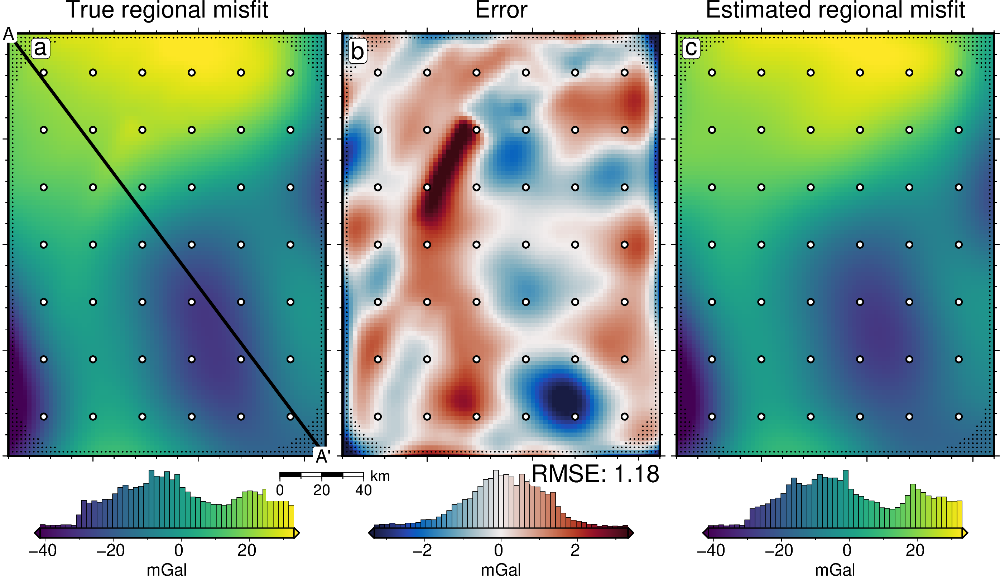

In [71]:
reg_lims = polar_utils.get_combined_min_max(
    [grav_grid.true_reg, grav_grid.reg],
    robust=True,
    robust_percentiles=(0.01, 0.99),
)
fig = maps.plot_grd(
    grav_grid.true_reg,
    fig_height=10,
    cmap="viridis",
    cpt_lims=reg_lims,
    title="True regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
    scalebar=True,
    scalebar_position="jBR+o-.9c/-.6c",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
# plot profiles location, and endpoints on map
fig.plot(
    vd.line_coordinates(profile_start, profile_end, size=100),
    pen="2p,black",
)
fig.text(
    x=profile_start[0],
    y=profile_start[1],
    text="A",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    x=profile_end[0],
    y=profile_end[1],
    text="A' ",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.6/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the regional error
dif = grav_grid.true_reg - grav_grid.reg
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        dif,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="Error",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",  # f"mGal, RMSE: {round(utils.rmse(dif),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMSE: {round(utils.rmse(dif), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the true regional misfit
fig = maps.plot_grd(
    grav_grid.reg,
    fig_height=10,
    cpt_lims=reg_lims,
    cmap="viridis",
    title="Estimated regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
fig.show()

    number     value             datetime_start          datetime_complete  \
0        0  0.648140 2025-10-14 17:26:24.563757 2025-10-14 17:26:26.896538   
2        2 -4.806474 2025-10-14 17:26:30.282361 2025-10-14 17:26:33.541067   
4        4  0.998421 2025-10-14 17:26:36.483900 2025-10-14 17:26:38.938787   
15      15  0.998077 2025-10-14 17:27:05.769515 2025-10-14 17:27:08.028613   
9        9  0.998313 2025-10-14 17:26:53.209184 2025-10-14 17:26:54.152648   
18      18  0.997754 2025-10-14 17:27:11.323140 2025-10-14 17:27:12.240750   
5        5  0.998274 2025-10-14 17:26:38.956968 2025-10-14 17:26:40.007788   
17      17  0.998367 2025-10-14 17:27:10.209005 2025-10-14 17:27:11.320529   
10      10  0.997820 2025-10-14 17:26:54.156784 2025-10-14 17:26:55.466887   
16      16  0.997945 2025-10-14 17:27:08.043038 2025-10-14 17:27:10.206136   
3        3  0.997784 2025-10-14 17:26:33.575002 2025-10-14 17:26:36.482301   
12      12  0.997467 2025-10-14 17:26:57.375020 2025-10-14 17:26

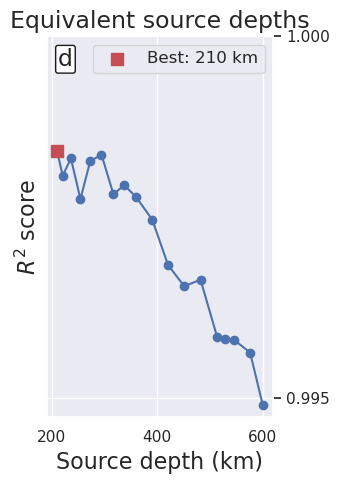

In [72]:
df = regional_study.trials_dataframe().sort_values("params_depth")
print(df)
df = df.iloc[2:].reset_index(drop=True)

_fig, ax = plt.subplots(figsize=(3.5, 5))
ax.plot(
    df.params_depth / 1e3,
    df.value,
    marker="o",
)

best_ind = df.value.idxmax()
ax.scatter(
    x=df.iloc[best_ind].params_depth / 1e3,
    y=df.iloc[best_ind].value,
    marker="s",
    color="r",
    s=80,
    zorder=20,
    label=f"Best: {round(df.iloc[best_ind].params_depth / 1e3)} km",
)

ax.legend(fontsize=12)
ax.set_xlabel("Source depth (km)", fontsize=16)
ax.set_ylabel("$R^2$ score", fontsize=16)
ax.set_title("Equivalent source depths", fontsize=17)

ax.annotate(
    "d",
    xy=(0.05, 0.97),
    xycoords="axes fraction",
    fontsize=17,
    va="top",
    ha="left",
    bbox=dict(boxstyle="round,pad=0.1", facecolor="white", edgecolor="k", pad=3.0),
)

ax.set_yticks([0.995, 1])
ax.yaxis.tick_right()
ax.yaxis.set_major_formatter(mpl.ticker.FormatStrFormatter("%.3f"))

_fig.tight_layout()
_fig.savefig(
    f"../paper/figures/Ross_Sea_0{i}_eq_sources.png", dpi=300, bbox_inches="tight"
)

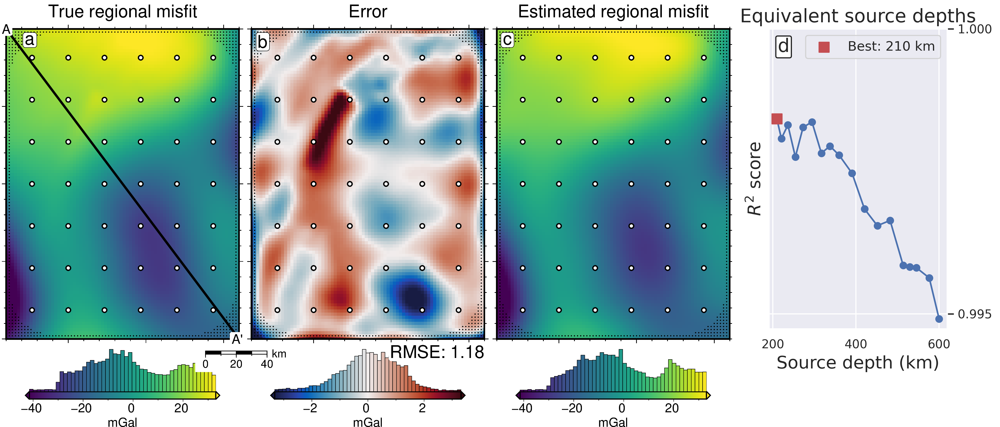

In [73]:
fig.image(
    imagefile=f"../paper/figures/Ross_Sea_0{i}_eq_sources.png",
    position="n1.01/.48+jML",
)
fig.savefig(f"../paper/figures/Ross_Sea_0{i}_grav_anomalies.png")
fig.show()

grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).


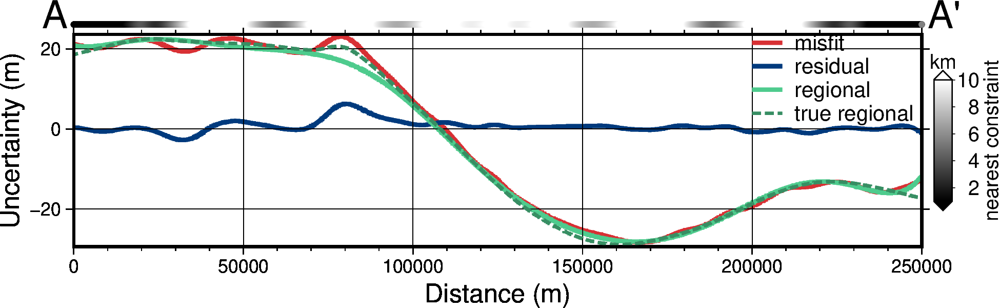

In [29]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

grav_grid["true_reg"] = grav_grid.basement_grav

titles = [
    "misfit",
    "residual",
    "regional",
    "true regional",
]
grids = [
    grav_grid.misfit,
    grav_grid.res,
    grav_grid.reg,
    grav_grid.true_reg,
]
data_ylims = None
data_dict = profiles.make_data_dict(
    names=titles,
    grids=grids,
    colors=[  # https://www.simplifiedsciencepublishing.com/resources/best-color-palettes-for-scientific-figures-and-data-visualizations
        "216/48/52",  # red, d83034
        "0/58/125",  # dark blue, 003a7d
        "78/203/141",  # green, 4ecb8d
        f"{78 * 0.7}/{203 * 0.7}/{141 * 0.7}",  # green, darker than above
        # "199/1/255", # purple, c701ff
        # "255/157/58", # orange, ff9d3a
        # "0/141/255", # med blue, 008dff
        # "255/115/182", # pink, ff73b6
        # "249/232/88", # yellow, f9e858
    ],
)

fig, df_data = profiles.plot_data(
    "points",
    start=profile_start,
    stop=profile_end,
    num=10000,
    fig_height=4,
    fig_width=14,
    data_dict=data_dict,
    data_legend_loc="jTR+o0c/-.2c",
    data_buffer=0.01,
    data_frame=["neSW", "xafg+lDistance (m)", "yag+lUncertainty (m)"],
    data_pen_style=[None, None, None, "4_2:2p"],
    data_pen_thickness=[2, 2, 2, 1.5],
    share_yaxis=True,
    start_label="A",
    end_label="A' ",
)

# get grid of min dists to nearest constraints
min_dist = utils.normalized_mindist(
    constraint_points,
    grids[0],
)

# set y height in data units for add dist to constraint points
data_max = df_data.drop(columns=["easting", "northing", "dist"]).max().max()

if data_ylims is not None:
    data_max = data_ylims[1]

df_data = profiles.sample_grids(
    df_data, min_dist, interpolation="b", sampled_name="min_dist"
)
# set color limits
series = [1e3, 10e3]

pygmt.makecpt(
    cmap="gray",
    series=series,
    background=True,
)
fig.shift_origin(
    yshift=".2c",
)
fig.plot(
    x=df_data.dist,
    y=np.ones_like(df_data.dist) * data_max,
    style="c0.1c",
    fill=df_data.min_dist,
    cmap=True,
    no_clip=True,
)
fig.shift_origin(
    yshift="-.2c",
)
with pygmt.config(
    FONT="26p,Helvetica,black",
):
    fig.colorbar(
        cmap=True,
        position="jMR+w2c/.3c+jML+v+o0.2c/0c+e",
        frame=["xa+lnearest constraint", "y+lkm"],
        scale=0.001,
    )
fig.savefig(f"../paper/figures/Ross_Sea_0{i}_grav_anomalies_profiles.png")
fig.show()

In [75]:
grav_error = np.abs(grav_df.gravity_anomaly_full_res_no_noise - grav_df.gravity_anomaly)
grav_error.describe()

count    7676.000000
mean        0.847248
std         0.755891
min         0.000369
25%         0.302118
50%         0.651053
75%         1.179984
max         8.188145
dtype: float64

In [76]:
reg_error = np.abs(grav_df.basement_grav - grav_df.reg)
reg_error.describe()

count    7676.000000
mean        0.897273
std         0.770416
min         0.000056
25%         0.332068
50%         0.721497
75%         1.241281
max         7.489381
dtype: float64

In [77]:
polar_utils.get_min_max(np.abs(final_bathymetry - bathymetry))

(np.float64(0.004187297208432028), np.float64(109.49392183017909))

gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.


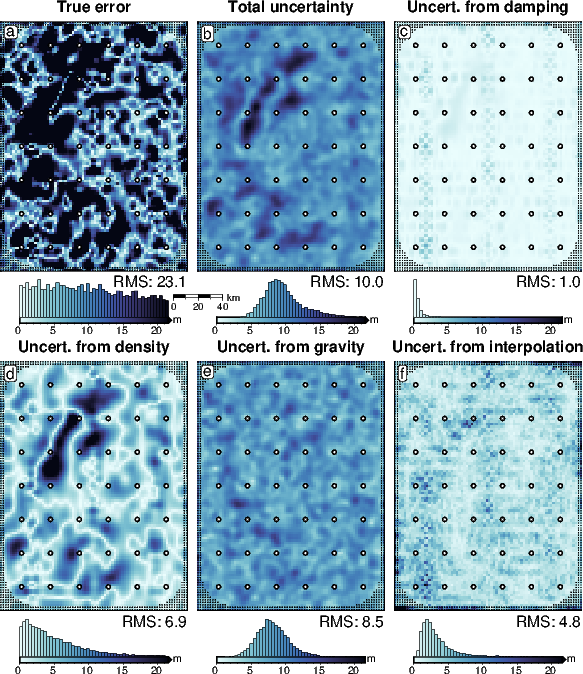

In [30]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
    "Uncert. from gravity",
    "Uncert. from interpolation",
]
grids = [
    np.abs(final_bathymetry - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
    sensitivity_ds.grav_stdev,
    sensitivity_ds.eq_sources_stdev,
]
sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=3,
    robust=False,
    fname=f"../paper/figures/Ross_Sea_0{i}_sensitivity.png",
)

## All together
### Damping CV's

0.014002832326761543
0.01406058612011891
0.014177009401440639
0.013382994085308205
0.013422413235354692


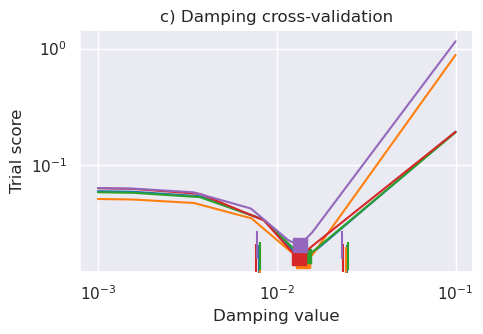

In [79]:
fig_c, ax = plt.subplots(figsize=(5, 3.5))

stdevs = [
    0.24436989744708637,  # test 1
    0.23960638100341206,  # test 2
    0.24466075491969516,  # test 3
    0.2412652540738441,  # test 4
    0.23771691803388237,  # test 5
]

for i, j in enumerate(damping_studies):
    scores = j.trials_dataframe().value.to_numpy()
    parameters = j.trials_dataframe().params_damping.to_numpy()
    param_name = "Damping"

    df0 = pd.DataFrame({"scores": scores, "parameters": parameters})
    df = df0.sort_values(by="parameters")

    best = df.scores.argmin()

    color = sns.color_palette("tab10")[i]

    ax.plot(
        df.parameters,
        df.scores,
        color=color,
    )

    # plot +/- stdev's
    best_damp = float(df.parameters.iloc[best])
    upper = float(10 ** (np.log10(best_damp) + stdevs[i]))
    lower = float(10 ** (np.log10(best_damp) - stdevs[i]))

    print(best_damp)
    # plot square for best value
    ax.plot(
        df.parameters.iloc[best],
        df.scores.iloc[best],
        "s",
        markersize=10,
        color=color,
        label=f"Test {i + 1}) {inversion_titles[i]}",
        zorder=2,
    )
    # plot lines for plus and minus stdev
    ax.plot(
        lower,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )
    ax.plot(
        upper,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )

ax.set_xscale("log")
ax.set_yscale("log")

ax.set_xlabel("Damping value")
ax.set_ylabel("Trial score")
ax.set_title("c) Damping cross-validation")

plt.tight_layout()
plt.savefig(
    "../paper/figures/Ross_Sea_damping_cvs.png",
    dpi=300,
)

### Density optimizations

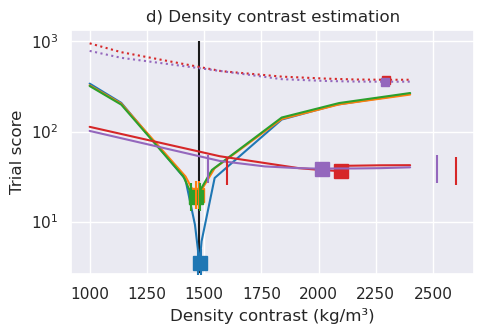

In [80]:
fig_b, ax = plt.subplots(figsize=(5, 3.5))

stdevs = [
    5,  # test 1
    5,  # test 2
    20,  # test 3
    500,  # test 4
    500,  # test 5
]
for i, j in enumerate(density_studies):
    scores = j.trials_dataframe().value.to_numpy()
    parameters = j.trials_dataframe().params_density_contrast.to_numpy()
    param_name = "Density"

    df0 = pd.DataFrame({"scores": scores, "parameters": parameters})
    df = df0.sort_values(by="parameters")

    best = df.scores.argmin()

    color = sns.color_palette("tab10")[i]

    ax.plot(
        df.parameters,
        df.scores,
        color=color,
    )

    # plot square for best value
    ax.plot(
        df.parameters.iloc[best],
        df.scores.iloc[best],
        "s",
        markersize=10,
        color=color,
        zorder=2,
    )

    # plot +/- stdev's
    upper = df.parameters.iloc[best] + stdevs[i]
    lower = df.parameters.iloc[best] - stdevs[i]

    # plot lines for plus and minus stdev
    ax.plot(
        lower,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )
    ax.plot(
        upper,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )

    # plot K-Folds approach for Tests 4 and 5
    if i in [3, 4]:
        f = f"../results/Ross_Sea/Ross_Sea_0{i + 1}_density_cv_study.pickle"
        with pathlib.Path(f).open("rb") as f:
            r = pickle.load(f)

        scores = r.trials_dataframe().value.to_numpy()
        parameters = r.trials_dataframe().params_density_contrast.to_numpy()
        param_name = "Density"

        df0 = pd.DataFrame({"scores": scores, "parameters": parameters})
        df = df0.sort_values(by="parameters")

        best = df.scores.argmin()

        color = sns.color_palette("tab10")[i]

        ax.plot(
            df.parameters,
            df.scores,
            color=color,
            linestyle="dotted",
        )

        # plot square for best value
        ax.plot(
            df.parameters.iloc[best],
            df.scores.iloc[best],
            "s",
            markersize=6,
            color=color,
            zorder=2,
        )

y_lims = ax.get_ylim()
ax.vlines(
    true_density_contrast,
    ymin=y_lims[0],
    ymax=y_lims[1],
    color="k",
    zorder=1,
    label="True density",
)

ax.set_xlabel("Density contrast (kg/m³)")
ax.set_ylabel("Trial score")
ax.set_title("d) Density contrast estimation")

plt.yscale("log")

plt.tight_layout()

plt.savefig(
    "../paper/figures/Ross_Sea_density_optimizations.png",
    dpi=300,
)

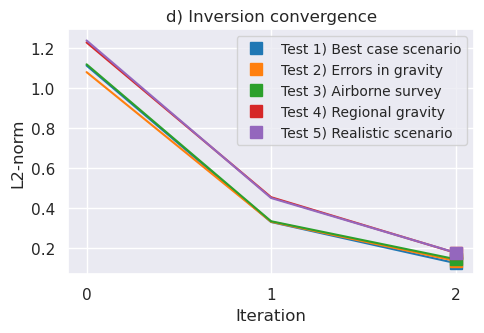

In [81]:
fig, ax1 = plt.subplots(figsize=(5, 3.5))

for i, j in enumerate(optimal_results):
    grav_results = j[1]
    params = j[2]

    # get misfit data at end of each iteration
    cols = [s for s in grav_results.columns.to_list() if "_final_misfit" in s]
    iters = len(cols)

    l2_norms = [np.sqrt(utils.rmse(grav_results[i])) for i in cols]
    starting_misfit = utils.rmse(grav_results["iter_1_initial_misfit"])
    starting_l2_norm = np.sqrt(starting_misfit)

    # add starting l2 norm to the beginning of the list
    l2_norms.insert(0, starting_l2_norm)

    # calculate delta L2-norms
    delta_l2_norms = []
    for k, m in enumerate(l2_norms):
        if k == 0:
            delta_l2_norms.append(np.nan)
        else:
            delta_l2_norms.append(l2_norms[k - 1] / m)

    # get tolerance values
    l2_norm_tolerance = float(params["L2 norm tolerance"])
    delta_l2_norm_tolerance = float(params["Delta L2 norm tolerance"])

    color = sns.color_palette("tab10")[i]

    # plot L2-norm convergence
    ax1.plot(
        range(iters + 1),
        l2_norms,
        color=color,
    )
    # plot square for end iteration
    ax1.plot(
        iters,
        l2_norms[-1],
        "s",
        markersize=8,
        color=color,
        zorder=2,
        label=f"Test {i + 1}) {inversion_titles[i]}",
    )
# set x axis to integer values
ax1.xaxis.set_major_locator(mpl.ticker.MaxNLocator(integer=True))

ax1.legend(loc="upper right", fontsize=10)

# set axis labels, ticks and gridlines
ax1.set_xlabel("Iteration")
ax1.set_ylabel("L2-norm")
ax1.tick_params(axis="y", which="both")
plt.title("d) Inversion convergence")
plt.tight_layout()
plt.savefig(
    "../paper/figures/Ross_Sea_convergences.png",
    dpi=300,
)
plt.show()

### Power spectrum

In [82]:
dif_grids = []
for g in final_bathymetries:
    # for g in final_stochastic_means:
    dif_grids.append(bathymetry - g)

# set min max as 2nd to last grid
dif_lims = polar_utils.get_min_max(dif_grids[-2], robust=True)

dif_lims

(np.float64(-21.621033707139702), np.float64(12.798915128951933))

requested spacing (2000.0) is smaller than the original (5000.0).
requested spacing (2000.0) is smaller than the original (10000.0).
requested spacing (2000.0) is smaller than the original (20000.0).


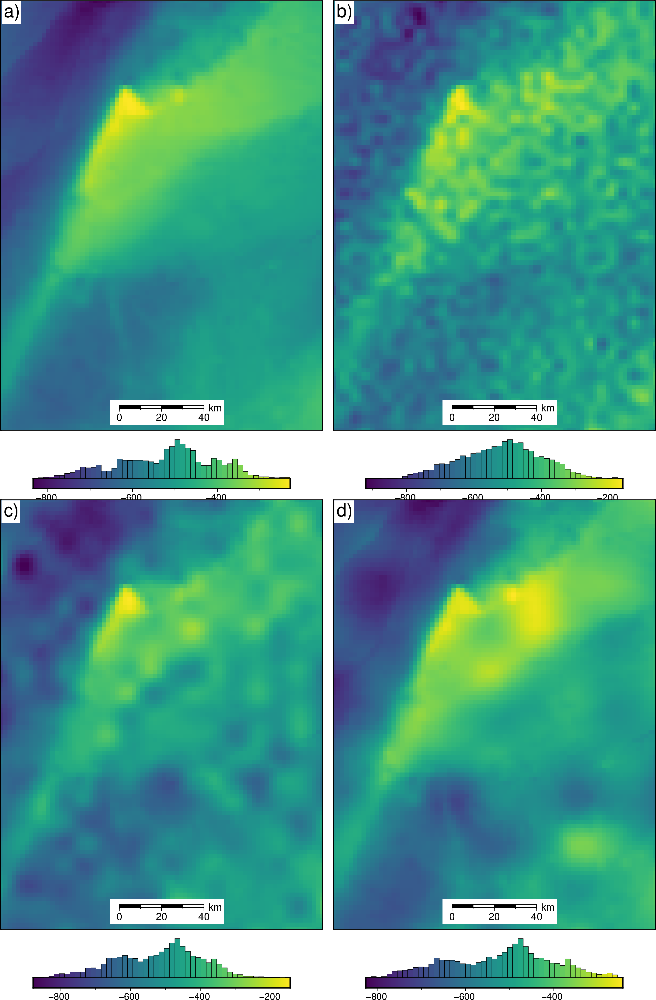

makecpt [ERROR]: Option T: min >= max
supplied min value is greater or equal to max value
Grid/points are a constant value, can't make a colorbar histogram!


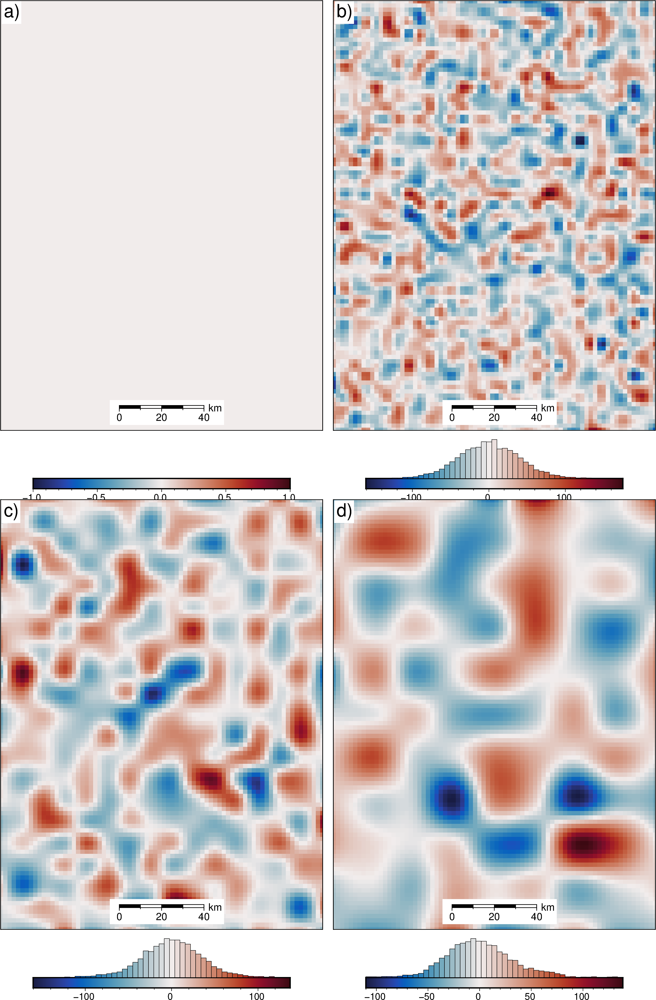

In [83]:
names = ["true", 5, 10, 20]

true = bathymetry
grids = [
    true,
    *[
        inv_synthetic.contaminate_with_long_wavelength_noise(
            true,
            coarsen_factor=None,
            spacing=x * 1e3,
            noise_as_percent=False,
            noise=50,
        )
        for x in names[1:]
    ],
]

fig = maps.subplots(
    grids,
    hist=True,
    cmap="viridis",
    scalebar=True,
)
fig.show()

fig = maps.subplots(
    [g - true for g in grids],
    hist=True,
    cmap="balance+h0",
    scalebar=True,
)
fig.show()

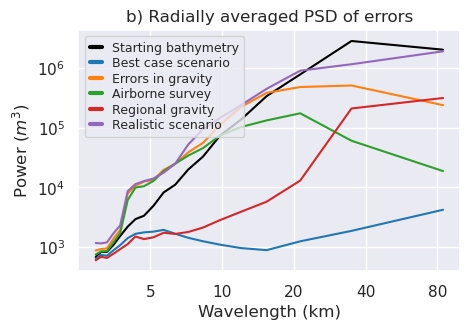

In [84]:
names = [
    "Starting bathymetry",
    *[inversion_titles[i] for i in range(len(dif_grids))],
]

grids = [
    bathymetry - starting_bathymetry,
    *dif_grids,
]

raps_das = []
for i, g in enumerate(grids):
    raps_das.append(
        xrft.isotropic_power_spectrum(
            g,
            dim=["easting", "northing"],
            detrend="linear",
            truncate=False,
        )
    )

fig_b, ax = plt.subplots(figsize=(5, 3.5))

for i, da in enumerate(raps_das):
    c = "black" if i == 0 else sns.color_palette("tab10")[i - 1]

    ax.plot(
        (1 / da.freq_r) / 1e3,
        da,
        label=names[i],
        color=c,
    )

ax.set_xscale("log")
ax.set_yscale("log")
leg = ax.legend(
    loc="upper left",
    fontsize=9,
    labelspacing=0.2,
    handlelength=1,
)

for legobj in leg.legend_handles:
    legobj.set_linewidth(3)

ax.set_xlabel("Wavelength (km)")
ax.set_ylabel("Power ($m^3$)")
ax.set_title("b) Radially averaged PSD of errors")
plt.tight_layout()

ax.set_xticks(
    [
        5,
        10,
        20,
        40,
        80,
    ]
)
ax.xaxis.set_major_formatter(mpl.ticker.StrMethodFormatter("{x:.0f}"))

### Inversion results

In [85]:
# use combined min max
inversion_error_lims = (
    0,
    polar_utils.get_combined_min_max(abs_inversion_errors, robust=True)[1],
)

# set min max as 2nd to last grid
uncert_error_lims = polar_utils.get_min_max(uncert_errors[-2], robust=True)

inversion_error_lims, uncert_error_lims

((0, np.float64(58.26295740916967)),
 (np.float64(-7.316209640741482), np.float64(17.239395411739565)))

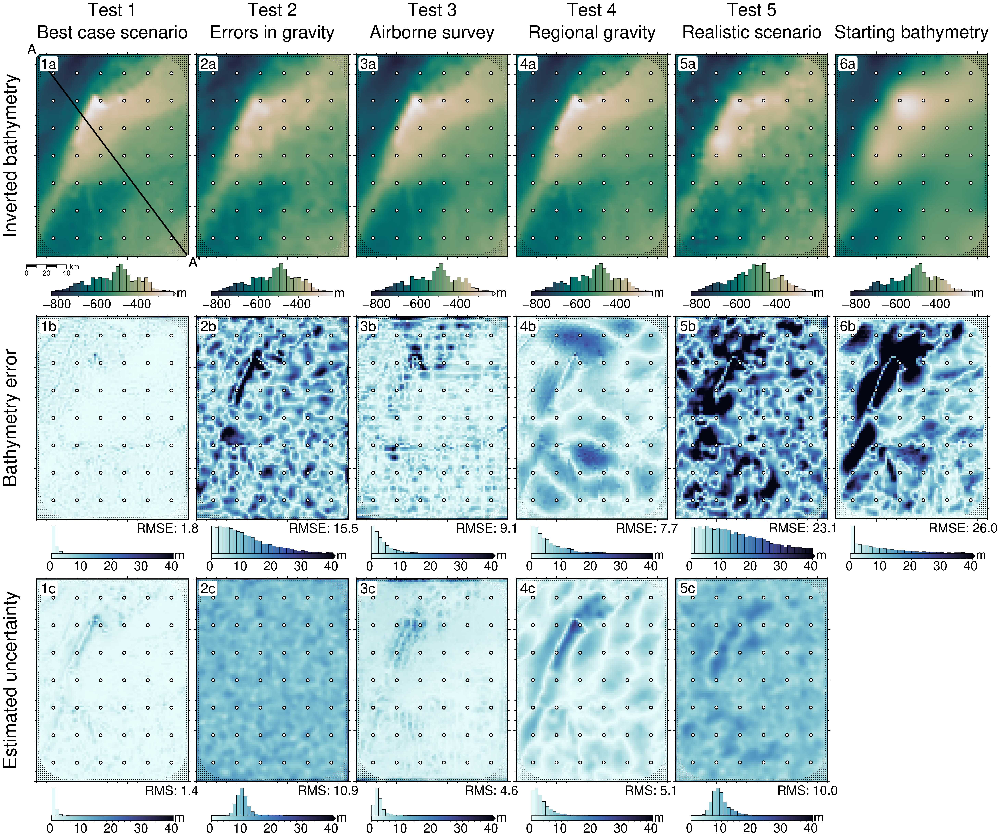

In [110]:
inversion_MAEs = []
inversion_RMSEs = []
uncert_MAEs = []
uncert_RMSEs = []
uncert_MAs = []
uncert_RMSs = []

constraint_points = constraint_points_dfs[0]

titles = [*inversion_titles, "Starting bathymetry"]

# set cmap lims
bathy_lims = polar_utils.get_min_max(
    bathymetry,
)
bathy_error_lims = (
    0,
    polar_utils.get_combined_min_max(
        np.abs([*dif_grids, bathymetry - starting_bathymetry]),
        robust=True,
        robust_percentiles=(0.07, 0.93),
    )[1],
)
uncert_lims = (
    0,
    polar_utils.get_combined_min_max(
        final_uncertainties,
        robust=True,
        robust_percentiles=(0.005, 0.995),
    )[1],
)

bathy_error_lims = (0, 40)
uncert_lims = bathy_error_lims

grds = [*final_bathymetries, starting_bathymetry]
for i, grd in enumerate(grds):
    if i == 0:
        fig = None
        origin_shift = "initialize"
        scalebar = True
    else:
        origin_shift = "both_shift"
        scalebar = False

    if i == len(grds) - 1:
        uncert_grd = None
        bathy_dif = bathymetry - grd
    else:
        uncert_grd = final_uncertainties[i]
        bathy_dif = dif_grids[i]

    # plot the inverted bathymetry
    fig = maps.plot_grd(
        grd,
        fig_height=10,
        cmap="rain",
        reverse_cpt=True,
        cpt_lims=bathy_lims,
        cbar_unit="m",
        cbar_font="28p,Helvetica,black",
        frame=["nswe", "xaf10000", "yaf10000"],
        hist=True,
        hist_bin_num=35,
        fig=fig,
        origin_shift=origin_shift,
        yshift_amount=2.1,
        points=constraint_points[~constraint_points.inside],
        points_style="p1p",
        scalebar=scalebar,
        scalebar_position="jBL+o-.5c/-.6c",
    )
    fig.plot(
        x=constraint_points[constraint_points.inside].easting,
        y=constraint_points[constraint_points.inside].northing,
        style="c.15c",
        fill="white",
        pen="1p,black",
    )

    # add title to each column
    fig.text(
        position="TC",
        justify="BC",
        text=titles[i],
        fill="white",
        font="25p,Helvetica,black",
        clearance="+tO",
        offset="j0/.8",
        no_clip=True,
    )
    if i == len(grds) - 1:
        pass
    else:
        fig.text(
            position="TC",
            justify="BC",
            text=f"Test {i + 1}",
            fill="white",
            font="25p,Helvetica,black",
            clearance="+tO",
            offset="j0/1.9",
            no_clip=True,
        )

    if i == 0:
        # add title to top row
        fig.text(
            position="ML",
            justify="BC",
            offset="j0/1",
            text="Inverted bathymetry",
            fill="white",
            angle=90,
            font="26p,Helvetica,black",
            clearance="+tO",
            no_clip=True,
        )
        # plot profiles location, and endpoints on map
        fig.plot(
            vd.line_coordinates(profile_start, profile_end, size=100),
            pen="2p,black",
        )
        fig.text(
            x=profile_start[0],
            y=profile_start[1],
            text="A",
            fill="white",
            font="20p,Helvetica,black",
            justify="BR",
            clearance="+tO",
            no_clip=True,
        )
        fig.text(
            x=profile_end[0],
            y=profile_end[1],
            text="A' ",
            fill="white",
            font="20p,Helvetica,black",
            justify="TL",
            clearance="+tO",
            no_clip=True,
        )

    # plot subplot labels (1a, 1b, 1c, etc.)
    fig.text(
        position="TL",
        text=f"{i + 1}a",
        fill="white",
        font="20p,Helvetica,black",
        offset="j.2/.2",
        clearance="+tO",
    )

    inversion_MAE = np.abs(bathy_dif).to_numpy().mean()
    inversion_RMSE = utils.rmse(bathy_dif)

    # add to lists
    inversion_MAEs.append(inversion_MAE)
    inversion_RMSEs.append(inversion_RMSE)

    # plot bathymetry error
    fig = maps.plot_grd(
        np.abs(bathy_dif),
        fig_height=10,
        cmap="ice",
        reverse_cpt=True,
        cpt_lims=bathy_error_lims,
        cbar_unit="m",
        cbar_font="28p,Helvetica,black",
        frame=["nswe", "xaf10000", "yaf10000"],
        hist=True,
        hist_bin_num=35,
        fig=fig,
        origin_shift="y",
        yshift_amount=-1.05,
        points=constraint_points[~constraint_points.inside],
        points_style="p1p",
    )
    fig.plot(
        x=constraint_points[constraint_points.inside].easting,
        y=constraint_points[constraint_points.inside].northing,
        style="c.15c",
        fill="white",
        pen="1p,black",
    )

    # add errors to plot
    fig.text(
        position="BR",
        justify="TR",
        text=f"RMSE: {round(inversion_RMSE, 1)}",
        fill="white",
        font="18p,Helvetica,black",
        offset="j-.5/.2",
        clearance="+tO",
        no_clip=True,
    )
    # plot subplot labels
    fig.text(
        position="TL",
        text=f"{i + 1}b",
        fill="white",
        font="20p,Helvetica,black",
        offset="j.2/.2",
        clearance="+tO",
    )
    if i == 0:
        # add title to 2nd row
        fig.text(
            position="ML",
            justify="BC",
            offset="j0/1",
            text="Bathymetry error",
            fill="white",
            angle=90,
            font="26p,Helvetica,black",
            clearance="+tO",
            no_clip=True,
        )

    # plot the uncertainty
    if i == len(grds) - 1:
        uncert_MA = None
        uncert_RMS = None
        uncert_MAE = None
        uncert_RMSE = None
    else:
        uncert_MA = np.abs(uncert_grd.to_numpy()).mean()
        uncert_RMS = utils.rmse(uncert_grd)
        uncert_MAE = np.abs(uncert_errors[i]).to_numpy().mean()
        uncert_RMSE = utils.rmse(uncert_errors[i])

    uncert_MAs.append(uncert_MA)
    uncert_RMSs.append(uncert_RMS)
    uncert_MAEs.append(uncert_MAE)
    uncert_RMSEs.append(uncert_RMSE)

    if i == len(grds) - 1:
        continue

    fig = maps.plot_grd(
        uncert_grd,
        fig_height=10,
        cmap="ice",
        reverse_cpt=True,
        cpt_lims=uncert_lims,
        cbar_unit="m",
        cbar_font="28p,Helvetica,black",
        frame=["nswe", "xaf10000", "yaf10000"],
        hist=True,
        hist_bin_num=35,
        fig=fig,
        origin_shift="y",
        yshift_amount=-1.05,
        points=constraint_points[~constraint_points.inside],
        points_style="p1p",
    )
    fig.plot(
        x=constraint_points[constraint_points.inside].easting,
        y=constraint_points[constraint_points.inside].northing,
        style="c.15c",
        fill="white",
        pen="1p,black",
    )

    # add mean / rms to plot
    fig.text(
        position="BR",
        justify="TR",
        text=f"RMS: {round(uncert_RMS, 1)}",
        fill="white",
        font="18p,Helvetica,black",
        offset="j-.5/.2",
        clearance="+tO",
        no_clip=True,
    )
    # plot subplot labels
    fig.text(
        position="TL",
        text=f"{i + 1}c",
        fill="white",
        font="20p,Helvetica,black",
        offset="j.2/.2",
        clearance="+tO",
    )
    if i == 0:
        # add title to 3rd row
        fig.text(
            position="ML",
            justify="BC",
            offset="j0/1",
            text="Estimated uncertainty",
            fill="white",
            angle=90,
            font="26p,Helvetica,black",
            clearance="+tO",
            no_clip=True,
        )

fig.savefig("../paper/figures/Ross_Sea_inversions.png", dpi=500)

fig.show()

### Sensitivity results

### Inversion result plots

In [7]:
hexs = sns.color_palette("tab10").as_hex()[:]
rgbs = [PIL.ImageColor.getrgb(h) for h in hexs]
colors = [f"{r[0]}/{r[1]}/{r[2]}" for r in rgbs]

In [8]:
inversion_titles

['Best case scenario',
 'Errors in gravity',
 'Airborne survey',
 'Regional gravity',
 'Realistic scenario']

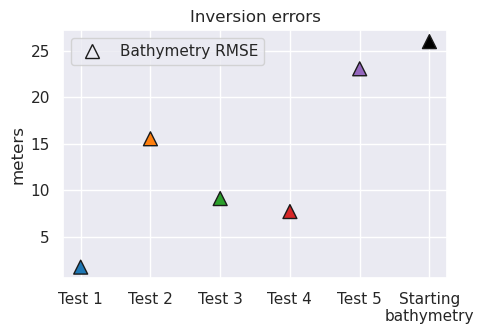

In [89]:
titles = [
    "Test 1",
    "Test 2",
    "Test 3",
    "Test 4",
    "Test 5",
    "Starting\nbathymetry",
]
df = pd.DataFrame(
    {
        "inversion_RMSE": inversion_RMSEs,
        "inversion_MAE": inversion_MAEs,
        "title": titles,
        "color": sns.color_palette("tab10")[0 : len(inversion_RMSEs) - 1] + ["black"],  # noqa: RUF005
    }
)

fig_a, ax1 = plt.subplots(figsize=(5, 3.5))

ax1.scatter(
    data=df,
    x="title",
    y="inversion_RMSE",
    color=df.color,
    marker="^",
    s=100,
    edgecolor="k",
)

ax1.set_ylabel("meters")

plt.title("Inversion errors")

inversion_label = mpl.lines.Line2D(
    [0],
    [0],
    label="Bathymetry RMSE",
    marker="^",
    markersize=10,
    markeredgecolor="k",
    markerfacecolor="none",
    linestyle="",
)
plt.legend(handles=[inversion_label])

plt.tight_layout()

plt.show()

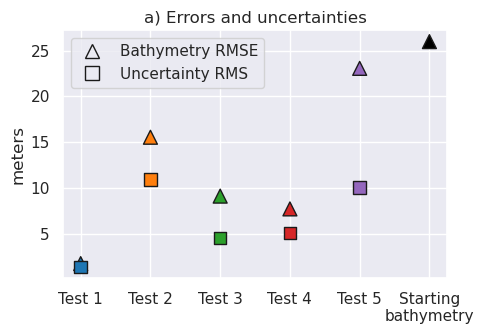

In [90]:
titles = [
    "Test 1",
    "Test 2",
    "Test 3",
    "Test 4",
    "Test 5",
    "Starting\nbathymetry",
]
df = pd.DataFrame(
    {
        "inversion_RMSE": inversion_RMSEs,
        "uncertainty_RMSE": uncert_RMSEs,
        "inversion_MAE": inversion_MAEs,
        "uncertainty_MAE": uncert_MAEs,
        "uncertainty_MAs": uncert_MAs,
        "uncertainty_RMSs": uncert_RMSs,
        "title": titles,
        "color": sns.color_palette("tab10")[0 : len(inversion_RMSEs) - 1] + ["black"],  # noqa: RUF005
    }
)

fig_a, ax1 = plt.subplots(figsize=(5, 3.5))

ax1.scatter(
    data=df,
    x="title",
    y="inversion_RMSE",
    color=df.color,
    marker="^",
    s=100,
    edgecolor="k",
)
ax1.scatter(
    data=df,
    x="title",
    y="uncertainty_RMSs",
    color=df.color,
    marker="s",
    s=80,
    edgecolor="k",
)

ax1.set_ylabel("meters")

plt.title("a) Errors and uncertainties")

inversion_label = mpl.lines.Line2D(
    [0],
    [0],
    label="Bathymetry RMSE",
    marker="^",
    markersize=10,
    markeredgecolor="k",
    markerfacecolor="none",
    linestyle="",
)

uncert_mean_label = mpl.lines.Line2D(
    [0],
    [0],
    label="Uncertainty RMS",
    marker="s",
    markersize=10,
    markeredgecolor="k",
    markerfacecolor="none",
    linestyle="",
)
plt.legend(handles=[inversion_label, uncert_mean_label])


plt.tight_layout()

plt.savefig(
    "../paper/figures/Ross_Sea_inversion_errors.png",
    dpi=300,
)
plt.show()

In [91]:
df.inversion_RMSE - df.uncertainty_RMSs

0     0.385471
1     4.629030
2     4.555937
3     2.656253
4    13.019786
5          NaN
dtype: float64

In [29]:
len(final_bathymetries)

5

In [14]:
[
    "black",
    *colors[0 : len(inversion_titles)],
    "black",
]

['black',
 '31/119/180',
 '255/127/14',
 '44/160/44',
 '214/39/40',
 '148/103/189',
 'black']

grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).


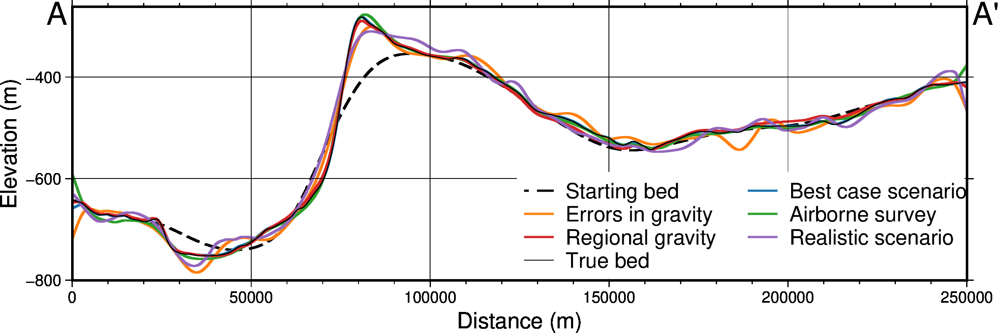

In [13]:
# topography dictionary
topo_names = ["Starting bed", *inversion_titles, "True bed"]
topo_grids = [starting_bathymetry, *final_bathymetries, bathymetry]

layers_dict = profiles.make_data_dict(
    names=topo_names,
    grids=topo_grids,
    colors=[
        "black",
        *colors[0 : len(inversion_titles)],
        "black",
    ],
)

fig, df_layers, df_data = profiles.plot_profile(
    "points",
    start=profile_start,
    stop=profile_end,
    num=100000,
    fig_height=5.5,
    fig_width=18,
    share_yaxis=True,
    layers_dict=layers_dict,
    layer_buffer=0.03,
    layers_legend_loc="jBR+jBR+o.05c/.03c+w9c",
    layers_legend_box=["+gwhite"],
    layers_legend_columns=2,
    layers_legend_font="12p,Helvetica,black",
    fill_layers=False,
    layers_frame=["neSW", "xafg+lDistance (m)", "yag+lElevation (m)"],
    layers_pen_thickness=[1.2, *[1.2] * len(inversion_titles), 0.5],
    layers_pen_style=["-", *[None] * len(inversion_titles), None],
    start_label="A",
    end_label="A' ",
    start_end_pen=None,
    start_label_justify="TR",
    end_label_justify="TL",
    start_end_fill=None,
)
fig.savefig("../paper/figures/Ross_Sea_inversion_profiles.png", dpi=500)
fig.show()

grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).


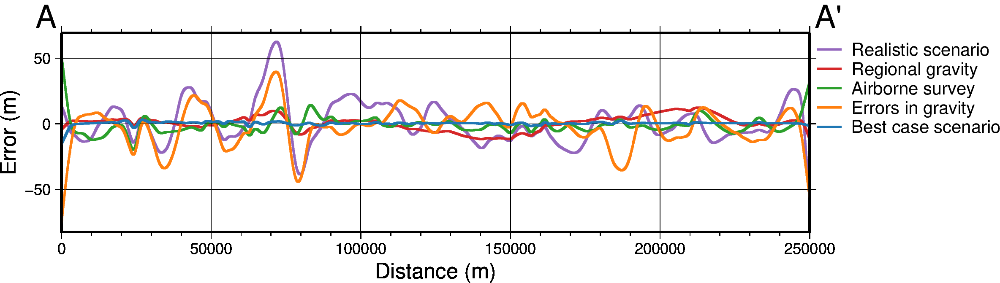

In [ ]:
# topography dictionary
topo_names = inversion_titles[::-1]
topo_grids = [x - bathymetry for x in final_bathymetries][::-1]

layers_dict = profiles.make_data_dict(
    names=topo_names,
    grids=topo_grids,
    colors=[
        *colors[0 : len(topo_grids)][::-1],
    ],
)

fig, df_layers, df_data = profiles.plot_profile(
    "points",
    start=profile_start,
    stop=profile_end,
    num=100000,
    fig_height=4,
    fig_width=15,
    share_yaxis=True,
    layers_dict=layers_dict,
    layer_buffer=0.05,
    layers_legend_loc="jTR+jTL+o0c/0c",
    layers_legend_box=None,
    fill_layers=False,
    layers_frame=["neSW", "xafg+lDistance (m)", "yag+lError (m)"],
    layers_pen_thickness=[1.2] * len(inversion_titles),
    start_label="A",
    end_label="A' ",
    start_end_pen=None,
)
fig.show()

### Inversion results subplot

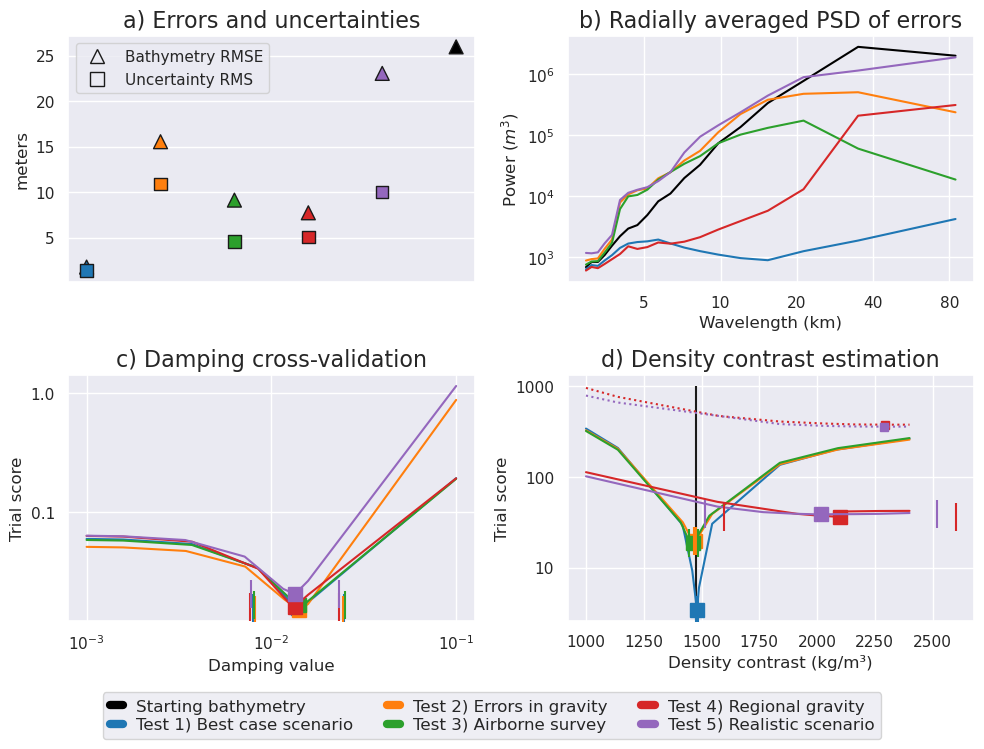

In [95]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(
    2,
    2,
    figsize=(5 * 2, 3.5 * 2),
)

###
###
# Errors and uncertainties
###
###

titles = [
    "Test 1",
    "Test 2",
    "Test 3",
    "Test 4",
    "Test 5",
    "Starting\nbathymetry",
]
df = pd.DataFrame(
    {
        "inversion_RMSE": inversion_RMSEs,
        "uncertainty_RMSE": uncert_RMSEs,
        "inversion_MAE": inversion_MAEs,
        "uncertainty_MAE": uncert_MAEs,
        "uncertainty_MAs": uncert_MAs,
        "uncertainty_RMSs": uncert_RMSs,
        "title": titles,
        "color": sns.color_palette("tab10")[0 : len(inversion_RMSEs) - 1] + ["black"],  # noqa: RUF005
    }
)

ax1.scatter(
    data=df,
    x="title",
    y="inversion_RMSE",
    color=df.color,
    marker="^",
    s=100,
    edgecolor="k",
)
ax1.scatter(
    data=df,
    x="title",
    y="uncertainty_RMSs",
    color=df.color,
    marker="s",
    s=80,
    edgecolor="k",
)

ax1.set_ylabel("meters")
ax1.set_xticks([])
ax1.set_title("a) Errors and uncertainties", fontsize=16)

inversion_label = mpl.lines.Line2D(
    [0],
    [0],
    label="Bathymetry RMSE",
    marker="^",
    markersize=10,
    markeredgecolor="k",
    markerfacecolor="none",
    linestyle="",
)

uncert_mean_label = mpl.lines.Line2D(
    [0],
    [0],
    label="Uncertainty RMS",
    marker="s",
    markersize=10,
    markeredgecolor="k",
    markerfacecolor="none",
    linestyle="",
)
ax1.legend(handles=[inversion_label, uncert_mean_label])

###
###
# Power spectra
###
###

names = [
    "Starting bathymetry",
    *[f"Test {i + 1}) {inversion_titles[i]}" for i in range(len(dif_grids))],
]

grids = [
    bathymetry - starting_bathymetry,
    *dif_grids,
]

raps_das = []
for i, g in enumerate(grids):
    raps_das.append(
        xrft.isotropic_power_spectrum(
            g,
            dim=["easting", "northing"],
            detrend="linear",
        )
    )

for i, da in enumerate(raps_das):
    c = "black" if i == 0 else sns.color_palette("tab10")[i - 1]

    lines = ax2.plot(
        (1 / da.freq_r) / 1e3,
        da,
        label=names[i],
        color=c,
    )

ax2.set_xscale("log")
ax2.set_yscale("log")
leg = fig.legend(
    ax2.get_lines(),
    [i.get_label() for i in ax2.get_lines()],
    loc="lower center",
    ncol=3,
    bbox_to_anchor=(0.5, -0.08),
    fontsize=12,
    labelspacing=0.2,
    handlelength=0.8,
)

for legobj in leg.legend_handles:
    legobj.set_linewidth(6)

ax2.set_xlabel("Wavelength (km)")
ax2.set_ylabel("Power ($m^3$)")
ax2.set_title("b) Radially averaged PSD of errors", fontsize=16)

ax2.set_xticks(
    [
        # 2,
        5,
        10,
        20,
        40,
        80,
    ]
)
ax2.xaxis.set_major_formatter(mpl.ticker.StrMethodFormatter("{x:.0f}"))

###
###
# Damping CV
###
###
stdevs = [
    0.2443699101356321,  # test 1
    0.23929672688818715,  # test 2
    0.24466078784954876,  # test 3
    0.24156679945478948,  # test 4
    0.23934002794701525,  # test 5
]

for i, j in enumerate(damping_studies):
    scores = j.trials_dataframe().value.to_numpy()
    parameters = j.trials_dataframe().params_damping.to_numpy()
    param_name = "Damping"

    df0 = pd.DataFrame({"scores": scores, "parameters": parameters})
    df = df0.sort_values(by="parameters")

    best = df.scores.argmin()

    color = sns.color_palette("tab10")[i]

    ax3.plot(
        df.parameters,
        df.scores,
        color=color,
    )

    # plot +/- stdev's
    best_damp = float(df.parameters.iloc[best])
    upper = float(10 ** (np.log10(best_damp) + stdevs[i]))
    lower = float(10 ** (np.log10(best_damp) - stdevs[i]))

    # plot square for best value
    ax3.plot(
        df.parameters.iloc[best],
        df.scores.iloc[best],
        "s",
        markersize=10,
        color=color,
        label=f"Test {i + 1}) {inversion_titles[i]}",
        zorder=2,
    )
    # plot lines for plus and minus stdev
    ax3.plot(
        lower,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )
    ax3.plot(
        upper,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )

ax3.set_xscale("log")
ax3.set_yscale("log")

ax3.set_xlabel("Damping value")
ax3.set_ylabel("Trial score")
ax3.set_title("c) Damping cross-validation", fontsize=16)
ax3.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter("{x:.1f}"))

###
###
# Density
###
###
stdevs = [
    5,  # test 1
    5,  # test 2
    20,  # test 3
    500,  # test 4
    500,  # test 5
]
for i, j in enumerate(density_studies):
    scores = j.trials_dataframe().value.to_numpy()
    parameters = j.trials_dataframe().params_density_contrast.to_numpy()
    param_name = "Density"

    df0 = pd.DataFrame({"scores": scores, "parameters": parameters})
    df = df0.sort_values(by="parameters")

    best = df.scores.argmin()

    color = sns.color_palette("tab10")[i]

    ax4.plot(
        df.parameters,
        df.scores,
        color=color,
    )

    # plot square for best value
    ax4.plot(
        df.parameters.iloc[best],
        df.scores.iloc[best],
        "s",
        markersize=10,
        color=color,
        zorder=2,
    )

    # plot +/- stdev's
    upper = df.parameters.iloc[best] + stdevs[i]
    lower = df.parameters.iloc[best] - stdevs[i]

    # plot lines for plus and minus stdev
    ax4.plot(
        lower,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )
    ax4.plot(
        upper,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )

    # plot K-Folds approach for Tests 4 and 5
    if i in [3, 4]:
        f = f"../results/Ross_Sea/Ross_Sea_0{i + 1}_density_cv_study.pickle"
        with pathlib.Path(f).open("rb") as f:
            r = pickle.load(f)

        scores = r.trials_dataframe().value.to_numpy()
        parameters = r.trials_dataframe().params_density_contrast.to_numpy()
        param_name = "Density"

        df0 = pd.DataFrame({"scores": scores, "parameters": parameters})
        df = df0.sort_values(by="parameters")

        best = df.scores.argmin()

        color = sns.color_palette("tab10")[i]

        ax4.plot(
            df.parameters,
            df.scores,
            color=color,
            linestyle="dotted",
        )

        # plot square for best value
        ax4.plot(
            df.parameters.iloc[best],
            df.scores.iloc[best],
            "s",
            markersize=6,
            color=color,
            zorder=2,
        )

y_lims = ax4.get_ylim()
ax4.vlines(
    true_density_contrast,
    ymin=y_lims[0],
    ymax=y_lims[1],
    color="k",
    zorder=1,
    label="True density",
)
# ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax4.set_xlabel("Density contrast (kg/m³)")
ax4.set_ylabel("Trial score")
ax4.set_title("d) Density contrast estimation", fontsize=16)
ax4.set_yscale("log")
ax4.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter("{x:.0f}"))

plt.tight_layout()

fig.savefig(
    "../paper/figures/Ross_Sea_inversion_results_subplots.png",
    dpi=300,
    bbox_inches="tight",
)